<a href="https://colab.research.google.com/github/arua23/2020-CBMS-DoubleU-Net/blob/master/Dataset_EDA/CSE_713_SafeSurf_Darknet_EDA_Layers_ydata_profiling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Y data profiling

In [ ]:
import sys
!{sys.executable} -m pip install -U ydata-profiling[notebook]
!pip install jupyter-contrib-nbextensions

In [ ]:
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


In [ ]:
# Standard Library Imports
from pathlib import Path

# Installed packages
import pandas as pd
from ipywidgets import widgets

# Our package
from ydata_profiling import ProfileReport
from ydata_profiling.utils.cache import cache_file

# SafeSurf DarkNet 2025 Layer 1

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
save_path = '/content/drive/MyDrive/Dataset/SafeSurf Darknet 2025'

## Importing the dataset and primary information

In [ ]:
import os
import pandas as pd

file_name = 'SafeSurf Dataset Layer 1.csv'
file_path = os.path.join(save_path, file_name)

data_frame = pd.read_csv(file_path)
print(f'The dataset has {data_frame.shape[0]} rows and {data_frame.shape[1]} columns')

The dataset has 252994 rows and 83 columns


In [ ]:
df = data_frame.copy()
df.head(10)

,Src IP,Src Port,Dst IP,Dst Port,Protocol,Timestamp,Flow Duration,Tot Fwd Pkts,Tot Bwd Pkts,TotLen Fwd Pkts,...,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,13.83.126.253,1194,192.168.200.136,42796,17,3/3/2025 20:31,118045988,177,175,48365,...,0,22590692.25,20961845.56,50206758,417585,6.708557e+06,9.217358e+05,7774731,5550108,Darknet
1,192.168.200.136,57621,192.168.200.255,57621,17,3/3/2025 20:31,90026370,3,1,132,...,0,0.00,0.00,0,0,3.000879e+07,1.250739e+04,30023227,30001233,Darknet
2,13.83.126.253,1194,192.168.200.136,42796,17,3/3/2025 20:33,111011533,7964,3228,10145344,...,0,23004743.00,15648124.03,39628371,8560635,8.078238e+06,2.523863e+06,10710281,5678637,Darknet
3,192.168.200.136,57621,192.168.200.255,57621,17,3/3/2025 20:33,99838718,5,1,220,...,0,3029139.00,0.00,3029139,3029139,2.420239e+07,1.164261e+07,30039552,6738482,Darknet
4,192.168.200.136,5353,224.0.0.251,5353,17,3/3/2025 20:32,119999236,1,1,45,...,0,0.00,0.00,0,0,1.199992e+08,0.000000e+00,119999236,119999236,Darknet
5,13.83.126.253,1194,192.168.200.136,42796,17,3/3/2025 20:35,119045844,415,344,299895,...,0,10726170.50,12914005.20,28960167,400832,6.061494e+06,1.539100e+06,9019345,5000947,Darknet
6,192.168.200.136,57621,192.168.200.255,57621,17,3/3/2025 20:36,95531971,5,1,220,...,0,5444231.00,0.00,5444231,5444231,3.002925e+07,1.116559e+04,30038850,30016995,Darknet
7,13.83.126.253,1194,192.168.200.136,42796,17,3/3/2025 20:38,119692965,700,586,408568,...,0,15943534.75,11868532.52,32343887,4060178,7.319981e+06,1.197165e+06,8881546,5978411,Darknet
8,192.168.200.136,57621,192.168.200.255,57621,17,3/3/2025 20:38,90003992,3,1,132,...,0,0.00,0.00,0,0,3.000133e+07,4.653712e+02,30001868,30001057,Darknet
9,192.168.200.136,43974,239.255.255.250,1900,17,3/3/2025 20:36,119999338,1,1,125,...,0,0.00,0.00,0,0,1.199993e+08,0.000000e+00,119999338,119999338,Darknet


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 252994 entries, 0 to 252993
Data columns (total 83 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Src IP             252994 non-null  object 
 1   Src Port           252994 non-null  int64  
 2   Dst IP             252994 non-null  object 
 3   Dst Port           252994 non-null  int64  
 4   Protocol           252994 non-null  int64  
 5   Timestamp          252994 non-null  object 
 6   Flow Duration      252994 non-null  int64  
 7   Tot Fwd Pkts       252994 non-null  int64  
 8   Tot Bwd Pkts       252994 non-null  int64  
 9   TotLen Fwd Pkts    252994 non-null  int64  
 10  TotLen Bwd Pkts    252994 non-null  int64  
 11  Fwd Pkt Len Max    252994 non-null  int64  
 12  Fwd Pkt Len Min    252994 non-null  int64  
 13  Fwd Pkt Len Mean   252994 non-null  float64
 14  Fwd Pkt Len Std    252994 non-null  float64
 15  Bwd Pkt Len Max    252994 non-null  int64  
 16  Bw

## Label Counts for Layer 1

Normal = 161590
Normal Percentage = 63.871079946559995
Darknet = 91404
Darknet Percentage = 36.12892005344


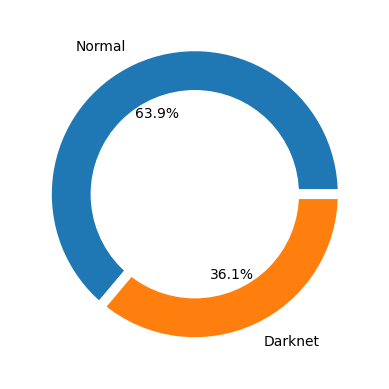

In [ ]:
import matplotlib.pyplot as plt

label_column = df['Label'].value_counts()
for label in label_column.index:
  print(f'{label} = {label_column[label]}')
  print(f'{label} Percentage = {label_column[label] / df.shape[0] * 100}')

per_val = label_column.values / df.shape[0] * 100
# Create the data
# create data
names = label_column.index
size = per_val

# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Custom wedges
plt.pie(size, labels=names, autopct= '%1.1f%%', wedgeprops = { 'linewidth' : 7, 'edgecolor' : 'white' })
p = plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

# Cleaning the dataset

## Removing Object Data Type

In [ ]:
def preprocessDF(df):
  pre_df = df.copy()

  pre_df['Label'] = pre_df['Label'].apply(lambda x: 1 if x == 'Darknet' else 0)

  for column in pre_df.columns:
    if pre_df[column].dtype == 'object':
      pre_df.drop(column, axis=1, inplace=True)
  # Dropping the columns which only has 1 uique value
  for column in pre_df.columns:
    if pre_df[column].dtype == 'int64':
      if pre_df[column].nunique() == 1:
        pre_df.drop(column, axis=1, inplace=True)

  return pre_df

pre_df = preprocessDF(df)
pre_df.head(10)

,Src Port,Dst Port,Protocol,Flow Duration,Tot Fwd Pkts,Tot Bwd Pkts,TotLen Fwd Pkts,TotLen Bwd Pkts,Fwd Pkt Len Max,Fwd Pkt Len Min,...,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,1194,42796,17,118045988,177,175,48365,48358,1330,64,...,0,22590692.25,20961845.56,50206758,417585,6.708557e+06,9.217358e+05,7774731,5550108,1
1,57621,57621,17,90026370,3,1,132,44,44,44,...,0,0.00,0.00,0,0,3.000879e+07,1.250739e+04,30023227,30001233,1
2,1194,42796,17,111011533,7964,3228,10145344,396674,1330,64,...,0,23004743.00,15648124.03,39628371,8560635,8.078238e+06,2.523863e+06,10710281,5678637,1
3,57621,57621,17,99838718,5,1,220,44,44,44,...,0,3029139.00,0.00,3029139,3029139,2.420239e+07,1.164261e+07,30039552,6738482,1
4,5353,5353,17,119999236,1,1,45,45,45,45,...,0,0.00,0.00,0,0,1.199992e+08,0.000000e+00,119999236,119999236,1
5,1194,42796,17,119045844,415,344,299895,105359,1330,40,...,0,10726170.50,12914005.20,28960167,400832,6.061494e+06,1.539100e+06,9019345,5000947,1
6,57621,57621,17,95531971,5,1,220,44,44,44,...,0,5444231.00,0.00,5444231,5444231,3.002925e+07,1.116559e+04,30038850,30016995,1
7,1194,42796,17,119692965,700,586,408568,182412,1330,64,...,0,15943534.75,11868532.52,32343887,4060178,7.319981e+06,1.197165e+06,8881546,5978411,1
8,57621,57621,17,90003992,3,1,132,44,44,44,...,0,0.00,0.00,0,0,3.000133e+07,4.653712e+02,30001868,30001057,1
9,43974,1900,17,119999338,1,1,125,125,125,125,...,0,0.00,0.00,0,0,1.199993e+08,0.000000e+00,119999338,119999338,1


## Removing Duplicate Instances (Rows)

In [ ]:
pre_df_cleaned = pre_df.copy()
pre_df_cleaned.drop_duplicates(keep = 'first', inplace=True)
print(f'The original dataset has {data_frame.shape[0]} rows and {data_frame.shape[1]} columns')
print(f'After cleaning dataset has {pre_df_cleaned.shape[0]} rows and {pre_df_cleaned.shape[1]} columns')

The original dataset has 252994 rows and 83 columns
After cleaning dataset has 155759 rows and 76 columns


## Removing np.inf values

In [ ]:
import numpy as np

# Removing infinity type float64 columns and NaNs
pre_df_cleaned = pre_df_cleaned.copy()
for column in pre_df.columns:
  if pre_df_cleaned[column].dtype == 'float64':
    pre_df_cleaned[column] = pre_df_cleaned[column].replace([np.inf, -np.inf], np.nan)
  # if pre_df_cleaned[column].dtype == 'int64':
  #   pre_df_cleaned[column] = pre_df_cleaned[column].replace(-np.inf, np.nan)
  # if pre_df_cleaned[column].value_counts().shape[0] <= 1:
  #   pre_df_cleaned.drop(column, axis=1, inplace=True)

pre_df_cleaned.dropna(inplace=True)

print(f'The original dataset has {data_frame.shape[0]} rows and {data_frame.shape[1]} columns')
print(f'After cleaning dataset has {pre_df_cleaned.shape[0]} rows and {pre_df_cleaned.shape[1]} columns')

The original dataset has 252994 rows and 83 columns
After cleaning dataset has 155665 rows and 76 columns


## Selecting Random Instances from the Dataset

In [ ]:
import numpy as np

# np.random.seed(42)

df_rand = pre_df_cleaned.copy()
# df_rand = df_rand.sample(10000, random_state=42).reset_index(drop=True)

print(f'After cleaning dataset has {pre_df_cleaned.shape[0]} rows and {pre_df_cleaned.shape[1]} columns')
print(f'The random sampled dataset has {df_rand.shape[0]} rows and {df_rand.shape[1]} columns')

After cleaning dataset has 155665 rows and 76 columns
The random sampled dataset has 155665 rows and 76 columns


In [ ]:
df_rand['Label'].value_counts()
df_rand.info()

<class 'pandas.core.frame.DataFrame'>
Index: 155665 entries, 0 to 172198
Data columns (total 76 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Src Port           155665 non-null  int64  
 1   Dst Port           155665 non-null  int64  
 2   Protocol           155665 non-null  int64  
 3   Flow Duration      155665 non-null  int64  
 4   Tot Fwd Pkts       155665 non-null  int64  
 5   Tot Bwd Pkts       155665 non-null  int64  
 6   TotLen Fwd Pkts    155665 non-null  int64  
 7   TotLen Bwd Pkts    155665 non-null  int64  
 8   Fwd Pkt Len Max    155665 non-null  int64  
 9   Fwd Pkt Len Min    155665 non-null  int64  
 10  Fwd Pkt Len Mean   155665 non-null  float64
 11  Fwd Pkt Len Std    155665 non-null  float64
 12  Bwd Pkt Len Max    155665 non-null  int64  
 13  Bwd Pkt Len Min    155665 non-null  int64  
 14  Bwd Pkt Len Mean   155665 non-null  float64
 15  Bwd Pkt Len Std    155665 non-null  float64
 16  Flow By

In [ ]:
cat_attributes = []
for column in df_rand.columns:
  if df_rand[column].dtype == 'int64':
    if df_rand[column].nunique() < 10 and df[column].nunique() > 1:
      cat_attributes.append(column)
      # print(df[column].value_counts())
print(cat_attributes)
print(f'The number of categorical features = {len(cat_attributes)}')

['Protocol', 'Bwd PSH Flags', 'FIN Flag Cnt', 'SYN Flag Cnt', 'RST Flag Cnt', 'PSH Flag Cnt', 'ACK Flag Cnt', 'CWE Flag Count', 'ECE Flag Cnt', 'Fwd Seg Size Min', 'Label']
The number of categorical features = 11


In [ ]:
# df_rand_num = df_rand.sample(10000, random_state=42).reset_index(drop=True)

In [ ]:
num_attributes_float = list(df_rand.select_dtypes(include=['float64']).columns)
num_attributes_int = [col for col in list(df_rand.select_dtypes(include=['int64']).columns) if col not in cat_attributes and col != 'Label'] # Exclude 'Label'
num_attributes = num_attributes_float + num_attributes_int

# Using Y data profiling to Generater dataset EDA of Categorical Variables

In [ ]:
df_rand_profile_cat = df_rand[cat_attributes]
# df_rand_profile_num = df_rand_num[num_attributes]

In [ ]:
profile_cat = ProfileReport(
    df_rand_profile_cat, title = "DarkNet 2025", html={"style": {"full_width": True}}, sort=None
)

In [ ]:
# profile.to_widgets()

In [ ]:
profile_cat

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 11/11 [00:04<00:00,  2.66it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
import random

df_rand = pre_df_cleaned.copy()

random.seed(42)
df_rand = df_rand.sample(1000, random_state=42).reset_index(drop=True)
df_rand_profile_num = df_rand[num_attributes + ['Label']]
selected_num_attributes = random.sample(num_attributes, 9)
selected_num_attributes.append('Label')
print(selected_num_attributes)
df_rand_profile_num = df_rand_profile_num[selected_num_attributes]

['Pkt Len Mean', 'Bwd Pkt Len Std', 'Bwd IAT Tot', 'Down/Up Ratio', 'Pkt Len Std', 'Idle Min', 'Fwd IAT Mean', 'Active Min', 'Flow IAT Mean', 'Label']


In [ ]:
profile_num = ProfileReport(
    df_rand_profile_num, title = "DarkNet 2025", html={"style": {"full_width": True}}, sort=None
)

In [ ]:
profile_num

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 10/10 [00:00<00:00, 62.74it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Basic Statistical Information

In [ ]:
df.describe()

,Src Port,Dst Port,Protocol,Flow Duration,Tot Fwd Pkts,Tot Bwd Pkts,TotLen Fwd Pkts,TotLen Bwd Pkts,Fwd Pkt Len Max,Fwd Pkt Len Min,...,Fwd Act Data Pkts,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min
count,252994.000000,252994.000000,252994.000000,2.529940e+05,252994.000000,252994.000000,2.529940e+05,2.529940e+05,252994.000000,252994.000000,...,252994.000000,252994.000000,2.529940e+05,2.529940e+05,2.529940e+05,2.529940e+05,2.529940e+05,2.529940e+05,2.529940e+05,2.529940e+05
mean,41744.259073,16512.500158,13.367803,1.858642e+07,87.701957,109.206807,5.738722e+04,1.274945e+05,409.885207,75.951596,...,53.029131,2.076539,5.208987e+05,2.767400e+05,8.855999e+05,3.013867e+05,3.810999e+06,8.088402e+05,4.627539e+06,3.093111e+06
std,20937.376401,21976.684553,5.336075,3.782923e+07,3230.207382,5200.793061,2.382011e+06,7.307613e+06,1292.935915,184.053581,...,1747.529612,4.863508,3.940645e+06,2.110181e+06,5.483929e+06,3.437296e+06,1.137949e+07,4.244723e+06,1.335800e+07,1.044995e+07
min,0.000000,0.000000,0.000000,-4.750000e+02,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,29553.000000,443.000000,6.000000,2.490000e+02,0.000000,1.000000,0.000000e+00,9.600000e+01,0.000000,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,51086.000000,1900.000000,17.000000,8.159600e+04,1.000000,2.000000,1.330000e+02,1.800000e+02,130.000000,0.000000,...,1.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,57762.750000,30202.000000,17.000000,9.009455e+06,9.000000,10.000000,1.475000e+03,1.850000e+03,543.000000,98.000000,...,6.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
max,65534.000000,65534.000000,17.000000,1.202151e+09,509640.000000,920278.000000,6.273761e+08,1.297241e+09,64681.000000,6000.000000,...,502840.000000,20.000000,1.146052e+08,7.385446e+07,1.146052e+08,1.146052e+08,1.200000e+08,7.747303e+07,1.200000e+08,1.200000e+08


## Feature Names and Lable

In [ ]:
df.columns

Index(['Src IP', 'Src Port', 'Dst IP', 'Dst Port', 'Protocol', 'Timestamp',
       'Flow Duration', 'Tot Fwd Pkts', 'Tot Bwd Pkts', 'TotLen Fwd Pkts',
       'TotLen Bwd Pkts', 'Fwd Pkt Len Max', 'Fwd Pkt Len Min',
       'Fwd Pkt Len Mean', 'Fwd Pkt Len Std', 'Bwd Pkt Len Max',
       'Bwd Pkt Len Min', 'Bwd Pkt Len Mean', 'Bwd Pkt Len Std', 'Flow Byts/s',
       'Flow Pkts/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
       'Flow IAT Min', 'Fwd IAT Tot', 'Fwd IAT Mean', 'Fwd IAT Std',
       'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Tot', 'Bwd IAT Mean',
       'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags',
       'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Len',
       'Bwd Header Len', 'Fwd Pkts/s', 'Bwd Pkts/s', 'Pkt Len Min',
       'Pkt Len Max', 'Pkt Len Mean', 'Pkt Len Std', 'Pkt Len Var',
       'FIN Flag Cnt', 'SYN Flag Cnt', 'RST Flag Cnt', 'PSH Flag Cnt',
       'ACK Flag Cnt', 'URG Flag Cnt', 'CWE Flag Count', 'ECE Flag Cnt',
       

# Feature Engineering

## Finding Categorical Attributes from the Features

In [ ]:
# Copying the original dataframe again

df = data_frame.copy()


# Replacing Whitespace in the column names
df.columns = df.columns.str.replace(' ', '_')

# Finding the categorical attributes from the dtypes int64
cat_attributes = []
for column in df.columns:
  if df[column].dtype == 'int64':
    if df[column].nunique() < 10 and df[column].nunique() > 1:
      cat_attributes.append(column)
      # print(df[column].value_counts())
print(cat_attributes)
print(f'The number of categorical features = {len(cat_attributes)}')

['Protocol', 'Bwd_PSH_Flags', 'FIN_Flag_Cnt', 'SYN_Flag_Cnt', 'RST_Flag_Cnt', 'PSH_Flag_Cnt', 'ACK_Flag_Cnt', 'CWE_Flag_Count', 'ECE_Flag_Cnt', 'Fwd_Seg_Size_Min']
The number of categorical features = 10


## Dropping Object type Features and Categorical Features with only 1 value

In [ ]:
# Dropping the object type features and modifying the label
def preprocessDF(df):
  pre_df = df.copy()

  pre_df['Label'] = pre_df['Label'].apply(lambda x: 1 if x == 'Darknet' else 0)

  for column in pre_df.columns:
    if pre_df[column].dtype == 'object':
      pre_df.drop(column, axis=1, inplace=True)

  for column in pre_df.columns:
    if pre_df[column].dtype == 'int64':
      if pre_df[column].nunique() == 1:
        pre_df.drop(column, axis=1, inplace=True)

  return pre_df

pre_df = preprocessDF(df)
pre_df.head(10)



,Src_Port,Dst_Port,Protocol,Flow_Duration,Tot_Fwd_Pkts,Tot_Bwd_Pkts,TotLen_Fwd_Pkts,TotLen_Bwd_Pkts,Fwd_Pkt_Len_Max,Fwd_Pkt_Len_Min,...,Fwd_Seg_Size_Min,Active_Mean,Active_Std,Active_Max,Active_Min,Idle_Mean,Idle_Std,Idle_Max,Idle_Min,Label
0,1194,42796,17,118045988,177,175,48365,48358,1330,64,...,0,22590692.25,20961845.56,50206758,417585,6.708557e+06,9.217358e+05,7774731,5550108,1
1,57621,57621,17,90026370,3,1,132,44,44,44,...,0,0.00,0.00,0,0,3.000879e+07,1.250739e+04,30023227,30001233,1
2,1194,42796,17,111011533,7964,3228,10145344,396674,1330,64,...,0,23004743.00,15648124.03,39628371,8560635,8.078238e+06,2.523863e+06,10710281,5678637,1
3,57621,57621,17,99838718,5,1,220,44,44,44,...,0,3029139.00,0.00,3029139,3029139,2.420239e+07,1.164261e+07,30039552,6738482,1
4,5353,5353,17,119999236,1,1,45,45,45,45,...,0,0.00,0.00,0,0,1.199992e+08,0.000000e+00,119999236,119999236,1
5,1194,42796,17,119045844,415,344,299895,105359,1330,40,...,0,10726170.50,12914005.20,28960167,400832,6.061494e+06,1.539100e+06,9019345,5000947,1
6,57621,57621,17,95531971,5,1,220,44,44,44,...,0,5444231.00,0.00,5444231,5444231,3.002925e+07,1.116559e+04,30038850,30016995,1
7,1194,42796,17,119692965,700,586,408568,182412,1330,64,...,0,15943534.75,11868532.52,32343887,4060178,7.319981e+06,1.197165e+06,8881546,5978411,1
8,57621,57621,17,90003992,3,1,132,44,44,44,...,0,0.00,0.00,0,0,3.000133e+07,4.653712e+02,30001868,30001057,1
9,43974,1900,17,119999338,1,1,125,125,125,125,...,0,0.00,0.00,0,0,1.199993e+08,0.000000e+00,119999338,119999338,1


In [ ]:
# pre_df['Label'].value_counts()
pre_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 252994 entries, 0 to 252993
Data columns (total 76 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Src_Port           252994 non-null  int64  
 1   Dst_Port           252994 non-null  int64  
 2   Protocol           252994 non-null  int64  
 3   Flow_Duration      252994 non-null  int64  
 4   Tot_Fwd_Pkts       252994 non-null  int64  
 5   Tot_Bwd_Pkts       252994 non-null  int64  
 6   TotLen_Fwd_Pkts    252994 non-null  int64  
 7   TotLen_Bwd_Pkts    252994 non-null  int64  
 8   Fwd_Pkt_Len_Max    252994 non-null  int64  
 9   Fwd_Pkt_Len_Min    252994 non-null  int64  
 10  Fwd_Pkt_Len_Mean   252994 non-null  float64
 11  Fwd_Pkt_Len_Std    252994 non-null  float64
 12  Bwd_Pkt_Len_Max    252994 non-null  int64  
 13  Bwd_Pkt_Len_Min    252994 non-null  int64  
 14  Bwd_Pkt_Len_Mean   252994 non-null  float64
 15  Bwd_Pkt_Len_Std    252994 non-null  float64
 16  Fl

In [ ]:
print(f'Number of instances = {pre_df.shape[0]}')
print(f'Number of features = {pre_df.shape[1]}')

Number of instances = 252994
Number of features = 76


In [ ]:
num_attributes_float = list(pre_df.select_dtypes(include=['float64']).columns)
num_attributes_int = list(pre_df.select_dtypes(include=['int64']).columns)

# Remove the categorical attributes from the list of integer attributes
num_attributes_int = [col for col in num_attributes_int if col not in cat_attributes]
num_attributes = num_attributes_float + num_attributes_int

# print(num_attributes)
# print(cat_attributes)
print(f'Tolat Numeric Attributes = {len(num_attributes)}')
print(f'Total Categorical Attributes = {len(cat_attributes)}')

Tolat Numeric Attributes = 66
Total Categorical Attributes = 10


In [ ]:
# %matplotlib inline
# import matplotlib.pyplot as plt
# pre_df[cat_attributes].hist(bins=100, figsize=(15,10))
# plt.show()

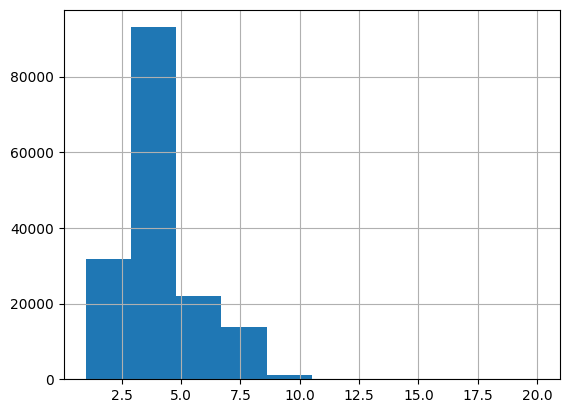

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


# Custom Bin Formation for Skewed Data
def create_custom_bin(start, stop, nbins_low, nbins_high, exponent = 2):
  non_linear_bins = np.linspace(start ** (1/exponent), stop ** (1/exponent), nbins_high + nbins_low + 1) ** exponent
  non_linear_bins = np.round(non_linear_bins, 2)
  return non_linear_bins

# pre_df_bin[num_attributes[0]].value_counts()
pre_df_bin = pre_df.copy()

pre_df_bin[num_attributes[0]] = pd.cut(
    pre_df_bin[num_attributes[0]],
    bins = create_custom_bin(pre_df_bin[num_attributes[0]].min(),
                             pre_df_bin[num_attributes[0]].max(),
                             15, 5),
    labels = [i for i in range(1, 21)]
)

pre_df_bin[num_attributes[0]].value_counts()
pre_df_bin[num_attributes[0]].hist()
plt.show()

Min and max value for Fwd_Pkt_Len_Std = 0.0 14524.18488
Mean value for Fwd_Pkt_Len_Std = 110.82880809417169
Number of values less than 110.82880809417169 = 191918
Number of values greater than or equal to 110.82880809417169 = 61076


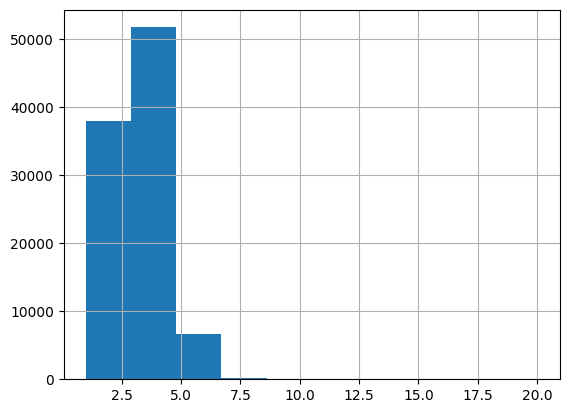

In [ ]:
pre_df_bin = pre_df.copy()

min_val, max_val = pre_df_bin[num_attributes[1]].min(), pre_df_bin[num_attributes[1]].max()
print(f'Min and max value for {num_attributes[1]} = {min_val} {max_val}')
mean_val = pre_df_bin[num_attributes[1]].mean()
print(f'Mean value for {num_attributes[1]} = {mean_val}')
nbin_low, nbin_high = (pre_df_bin[num_attributes[1]] < mean_val).sum(), (pre_df_bin[num_attributes[1]] >= mean_val).sum()
print(f'Number of values less than {mean_val} = {nbin_low}')
print(f'Number of values greater than or equal to {mean_val} = {nbin_high}')

if nbin_low > nbin_high:
  nbin_low = round(nbin_low / nbin_high) * 5
  nbin_high = 5
else:
  nbin_high = round(nbin_high / nbin_low) * 5
  nbin_low = 5
# print(nbin_high)
# print(nbin_low)
pre_df_bin[num_attributes[1]] = pd.cut(
    pre_df_bin[num_attributes[1]],
    bins = create_custom_bin(min_val, max_val, nbin_low, nbin_high),
    labels = [i for i in range(1, nbin_high+nbin_low+1)]
)

pre_df_bin[num_attributes[1]].value_counts()
pre_df_bin[num_attributes[1]].hist()
plt.show()

Binning column: Fwd_Pkt_Len_Mean


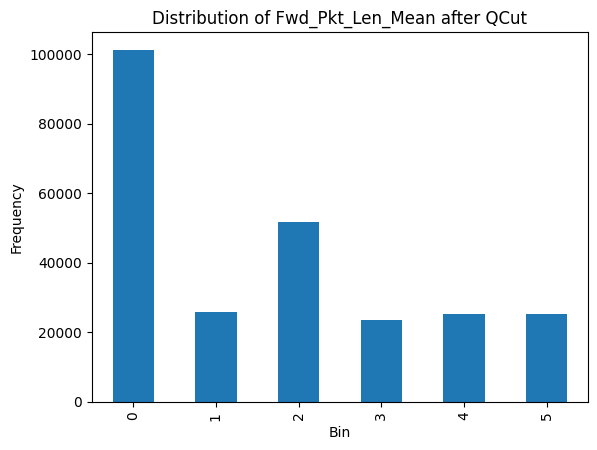

Binning column: Fwd_Pkt_Len_Std


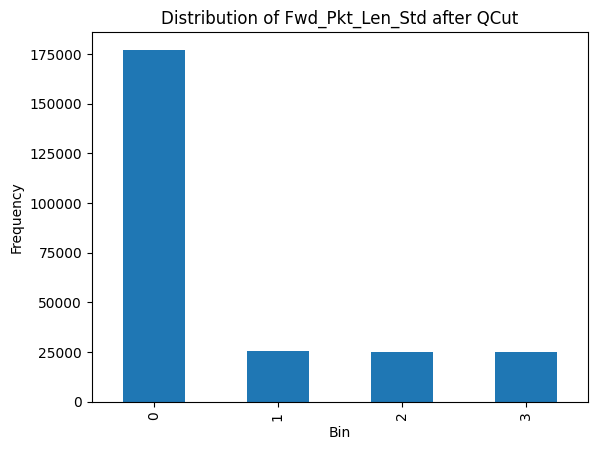

Binning column: Bwd_Pkt_Len_Mean


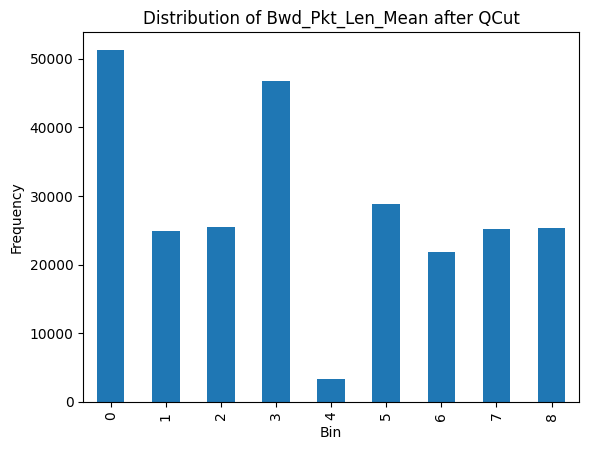

Binning column: Bwd_Pkt_Len_Std


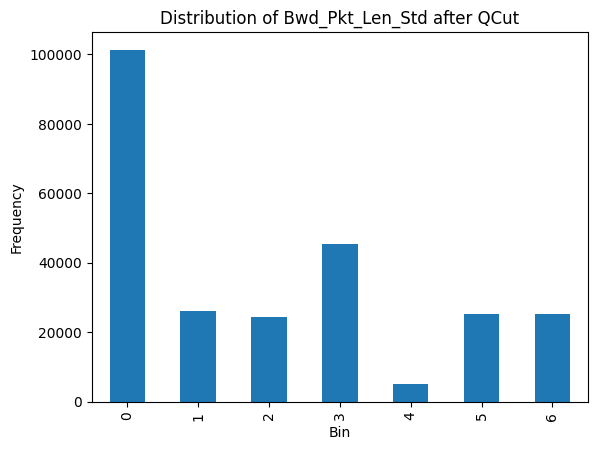

Binning column: Flow_Byts/s


/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:4779: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


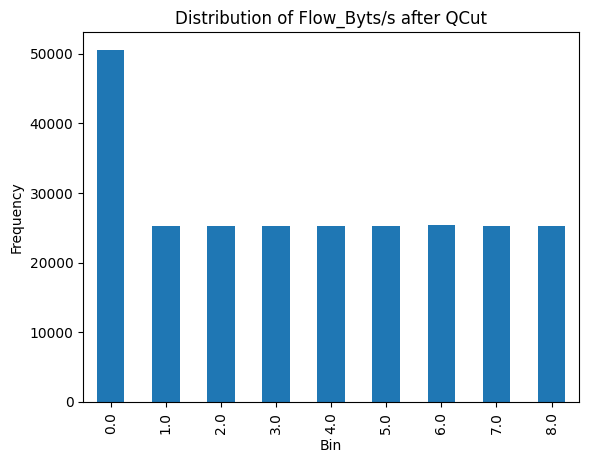

Binning column: Flow_Pkts/s


/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:4779: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


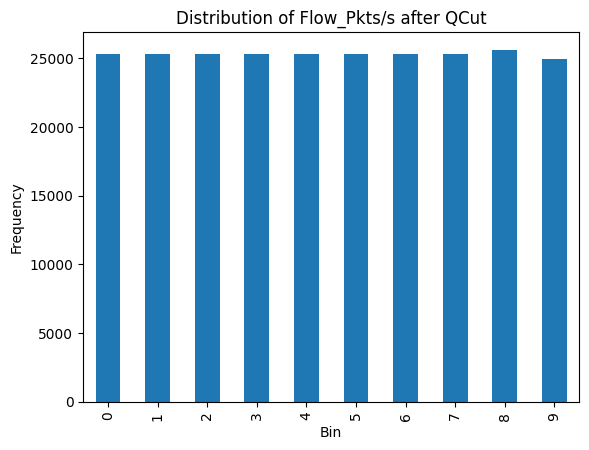

Binning column: Flow_IAT_Mean


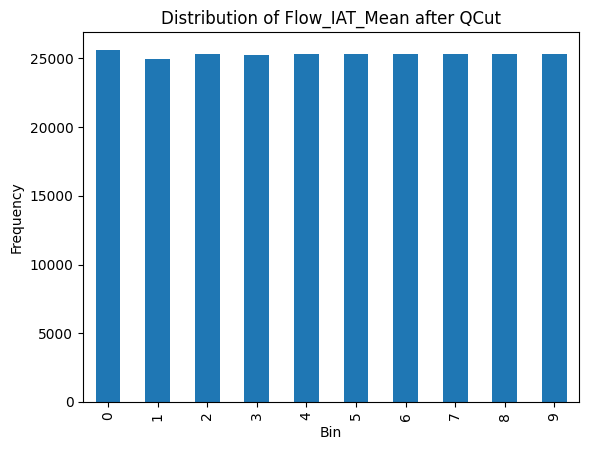

Binning column: Flow_IAT_Std


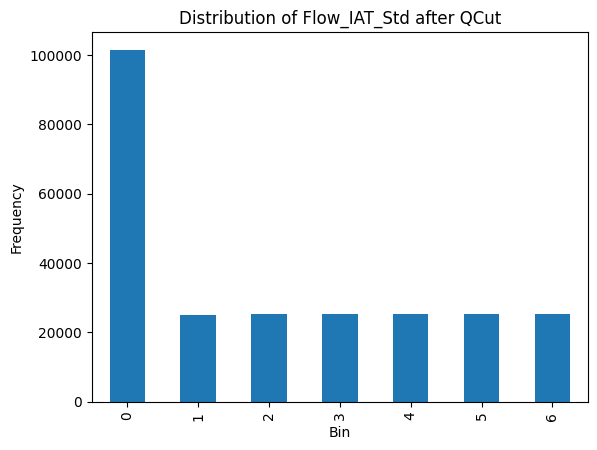

Binning column: Fwd_IAT_Mean


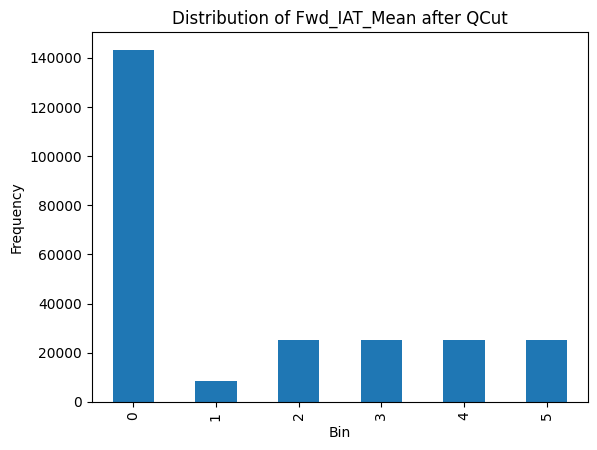

Binning column: Fwd_IAT_Std


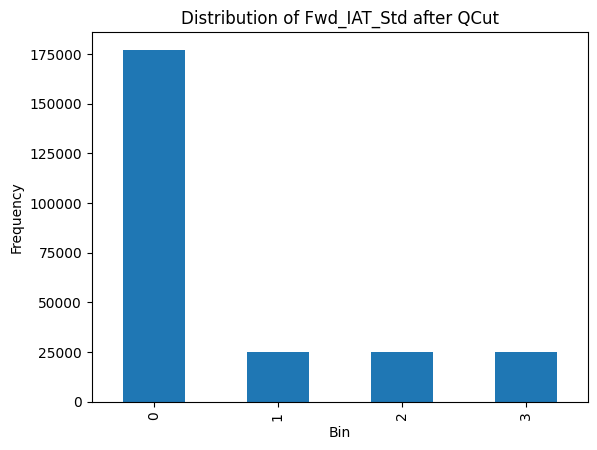

Binning column: Bwd_IAT_Mean


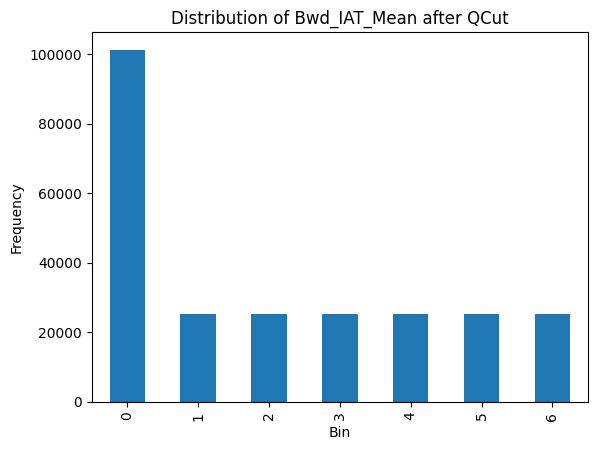

Binning column: Bwd_IAT_Std


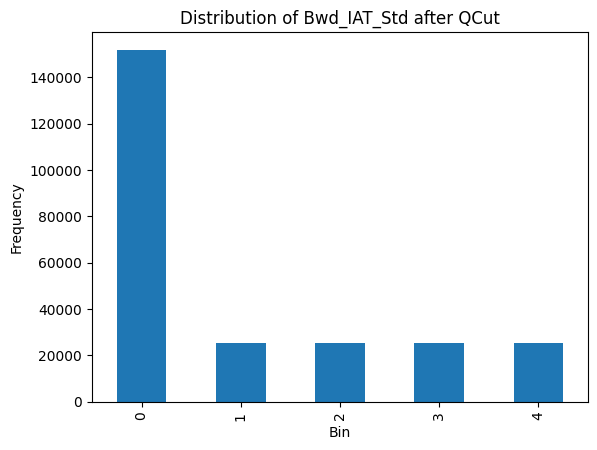

Binning column: Fwd_Pkts/s


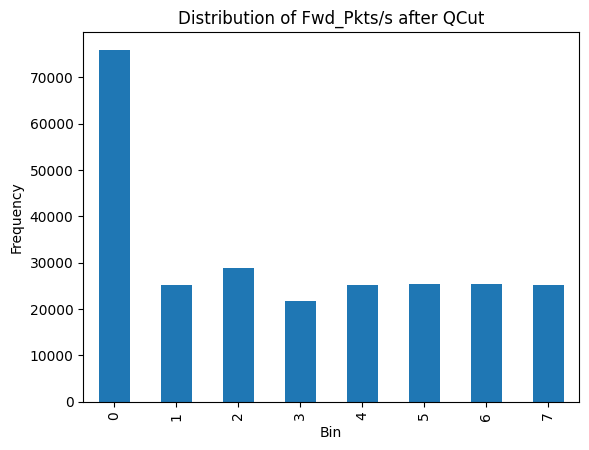

Binning column: Bwd_Pkts/s


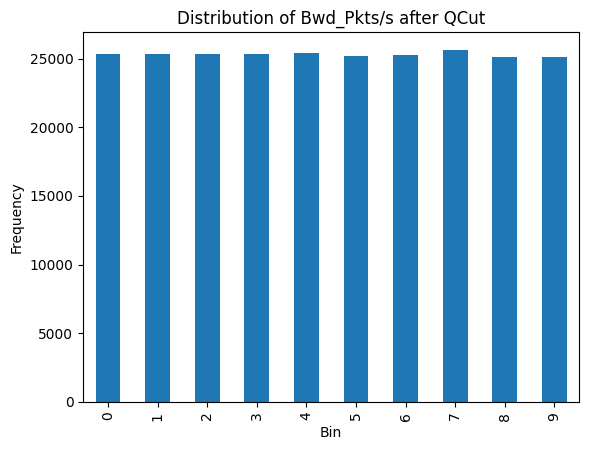

Binning column: Pkt_Len_Mean


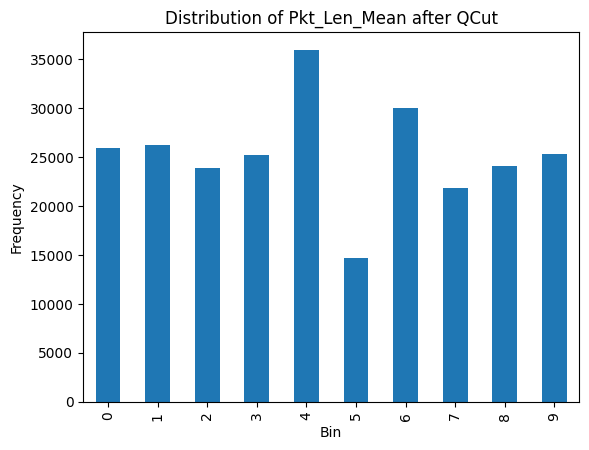

Binning column: Pkt_Len_Std


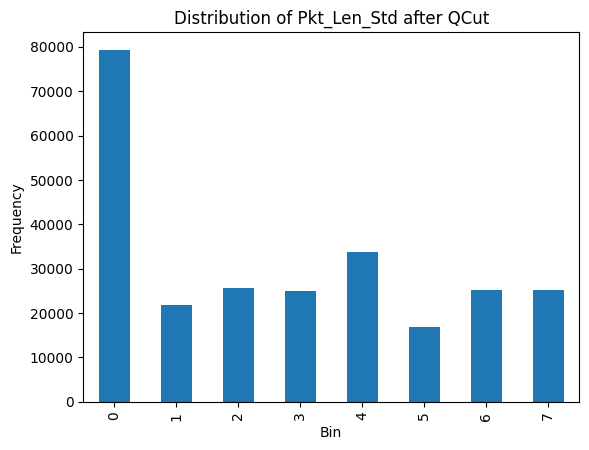

Binning column: Pkt_Len_Var


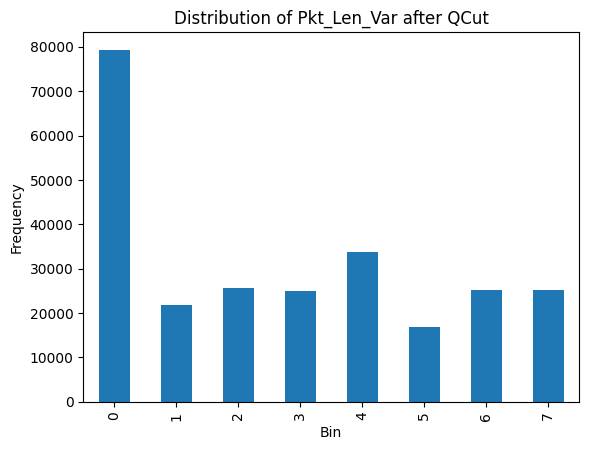

Binning column: Down/Up_Ratio


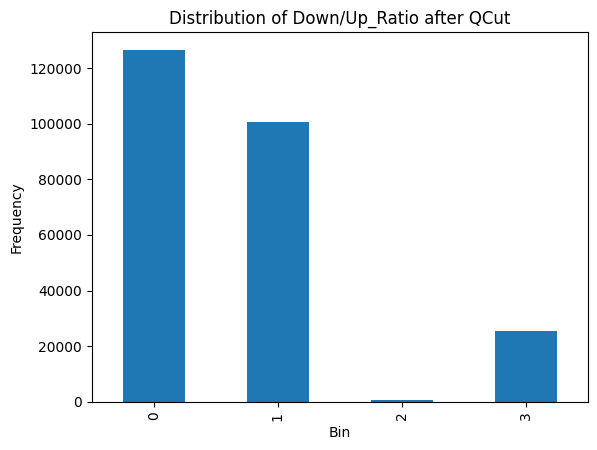

Binning column: Pkt_Size_Avg


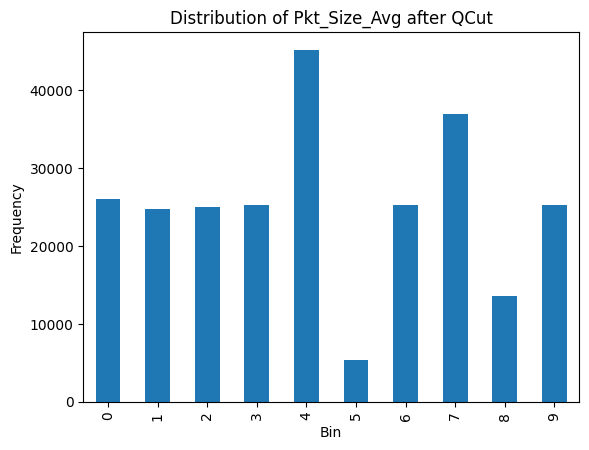

Binning column: Fwd_Seg_Size_Avg


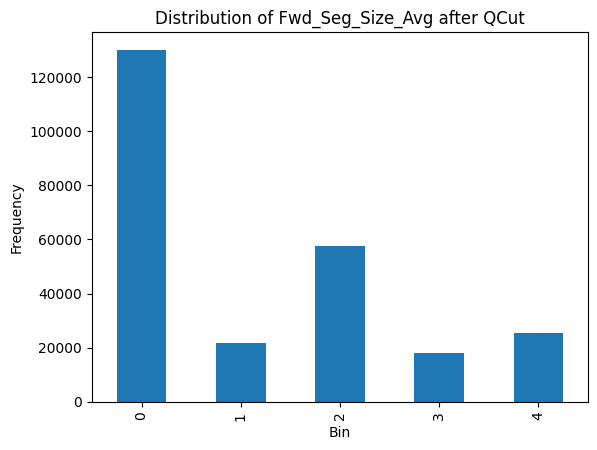

Binning column: Bwd_Seg_Size_Avg


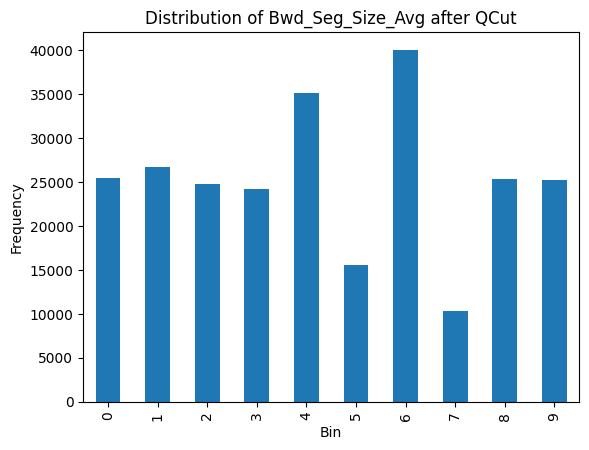

Binning column: Fwd_Byts/b_Avg


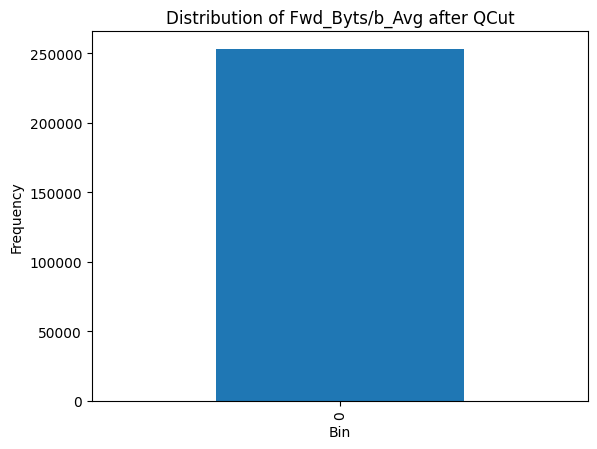

Binning column: Fwd_Pkts/b_Avg


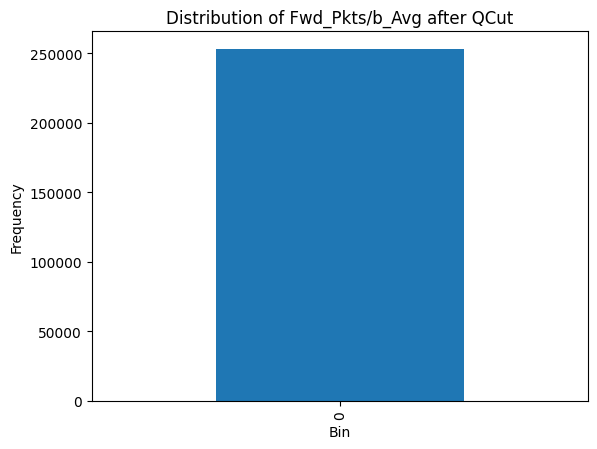

Binning column: Fwd_Blk_Rate_Avg


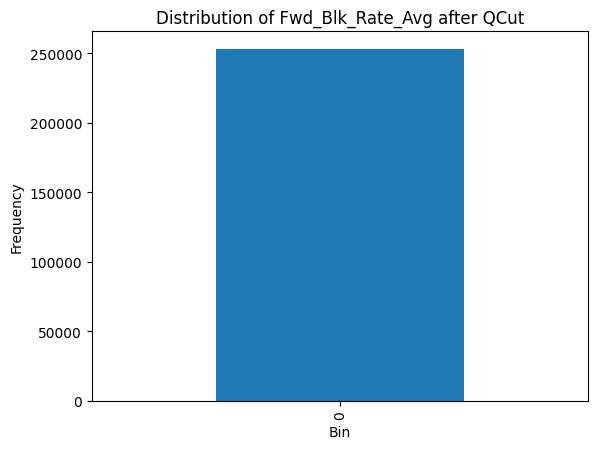

Binning column: Bwd_Byts/b_Avg


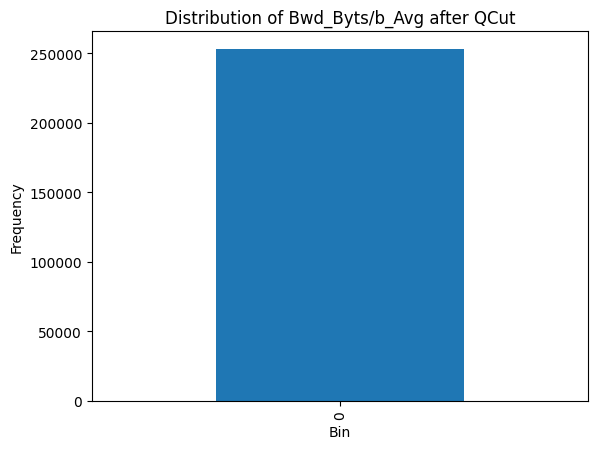

Binning column: Bwd_Pkts/b_Avg


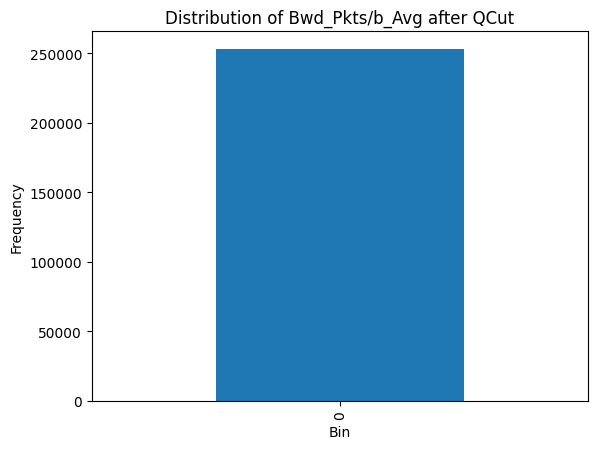

Binning column: Bwd_Blk_Rate_Avg


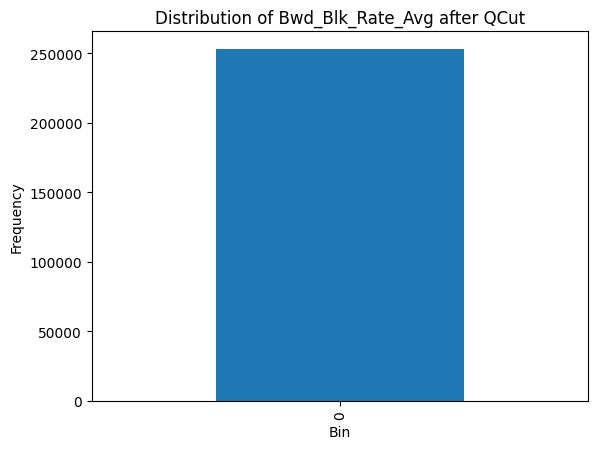

Binning column: Active_Mean


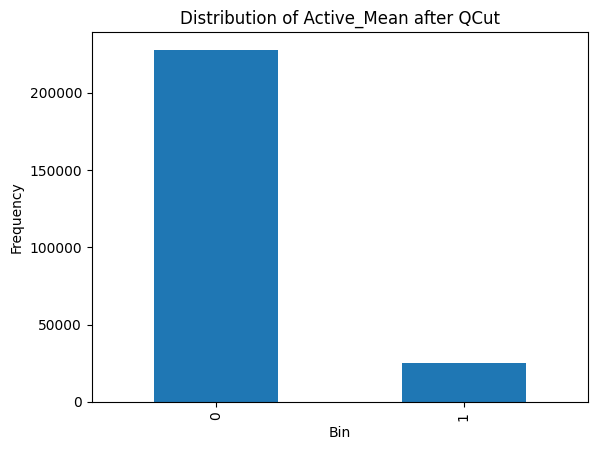

Binning column: Active_Std


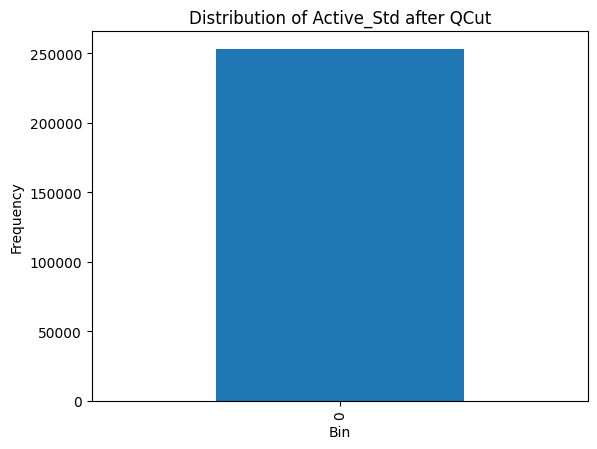

Binning column: Idle_Mean


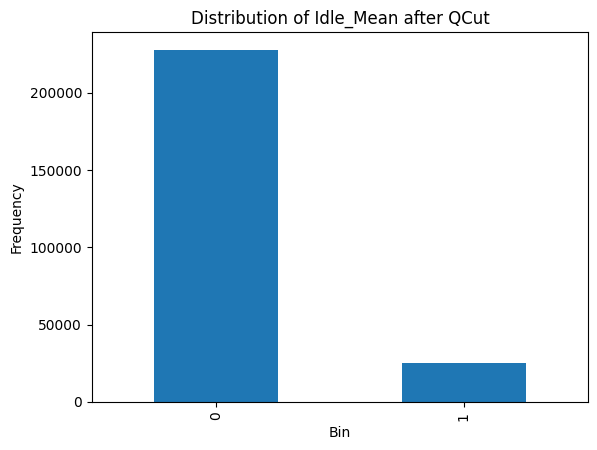

Binning column: Idle_Std


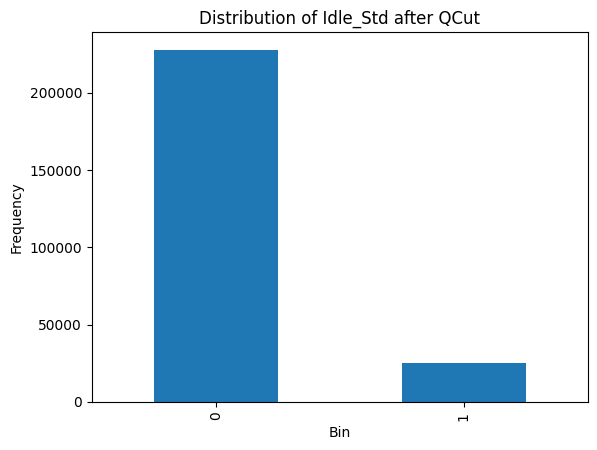

Binning column: Src_Port


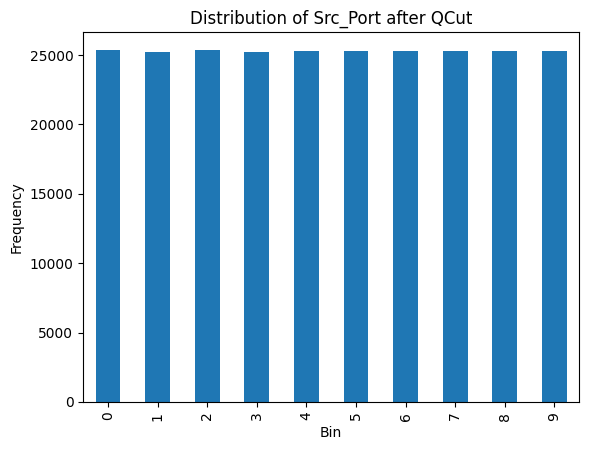

Binning column: Dst_Port


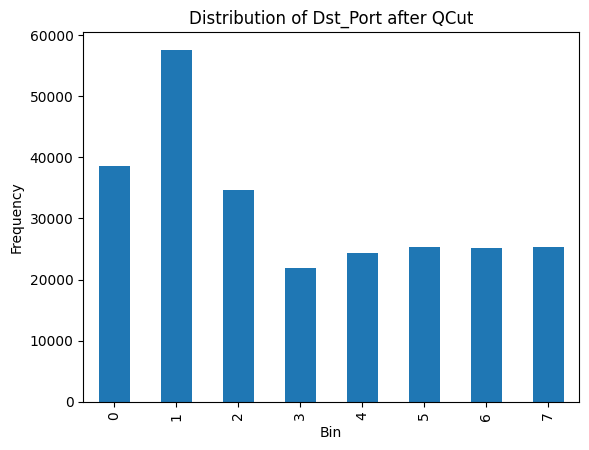

Binning column: Flow_Duration


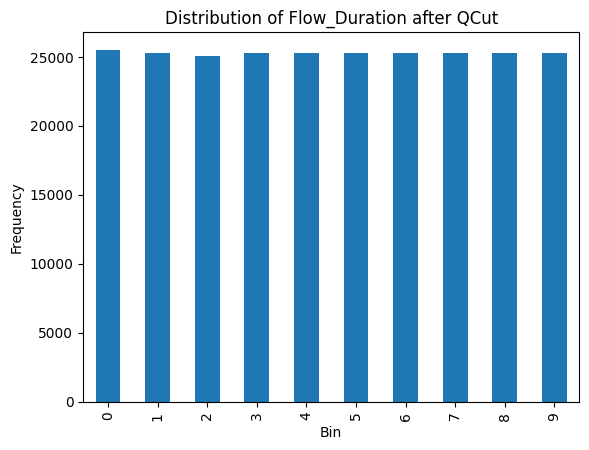

Binning column: Tot_Fwd_Pkts


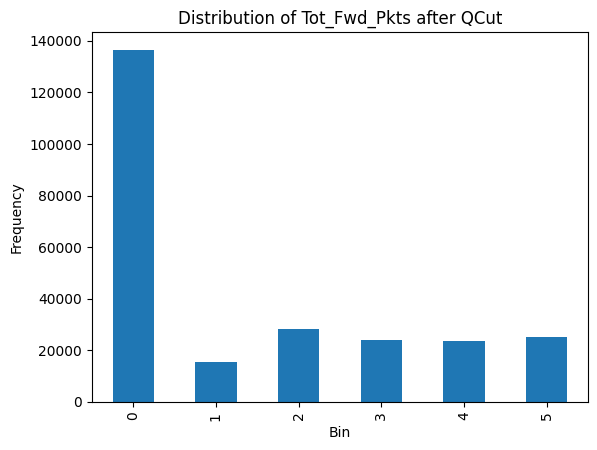

Binning column: Tot_Bwd_Pkts


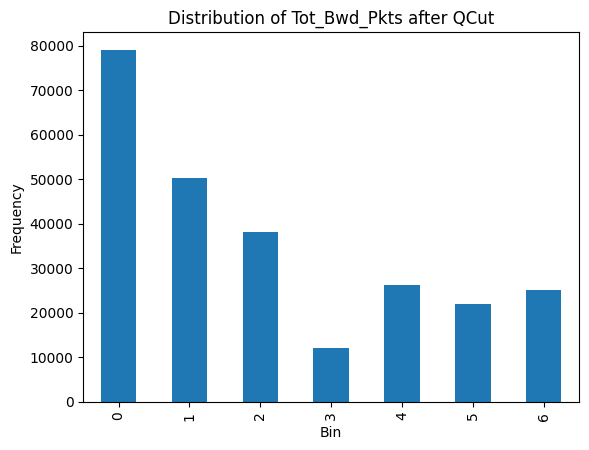

Binning column: TotLen_Fwd_Pkts


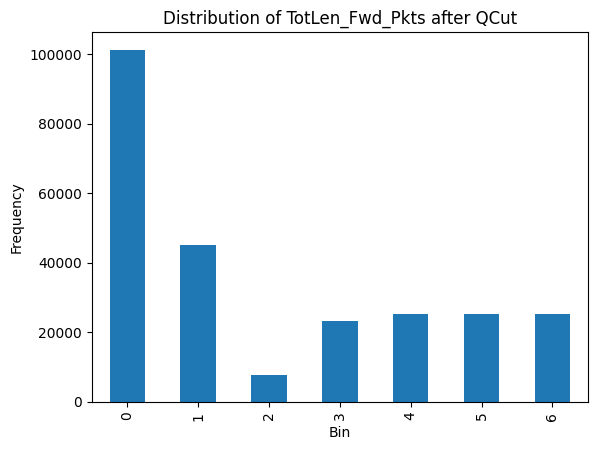

Binning column: TotLen_Bwd_Pkts


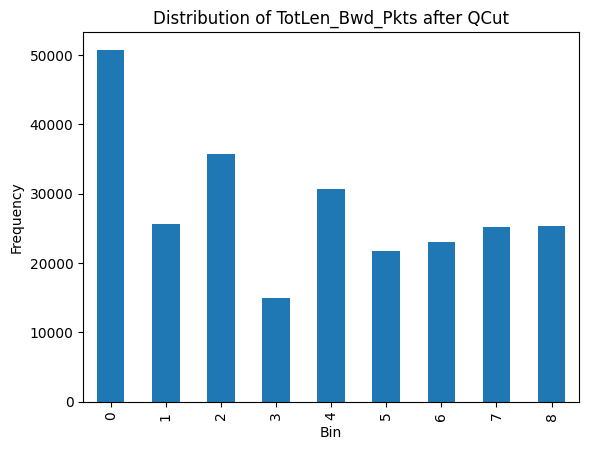

Binning column: Fwd_Pkt_Len_Max


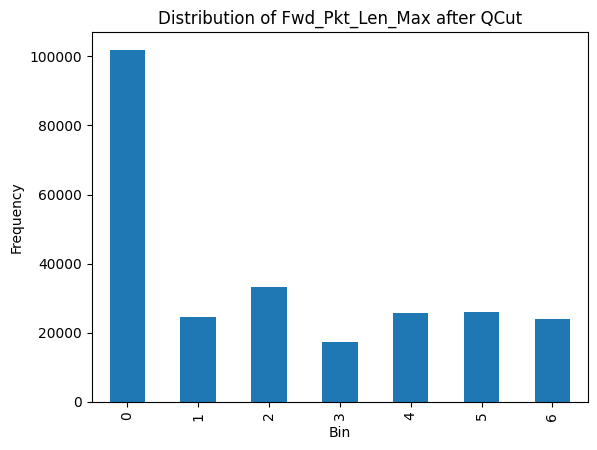

Binning column: Fwd_Pkt_Len_Min


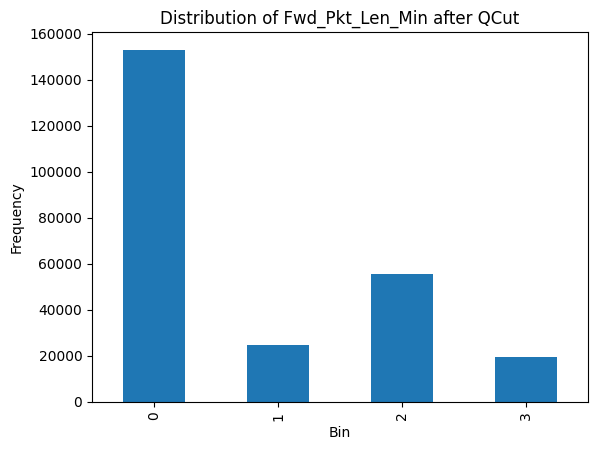

Binning column: Bwd_Pkt_Len_Max


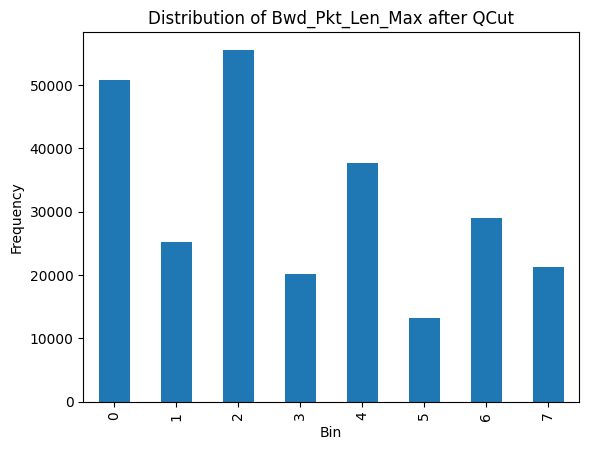

Binning column: Bwd_Pkt_Len_Min


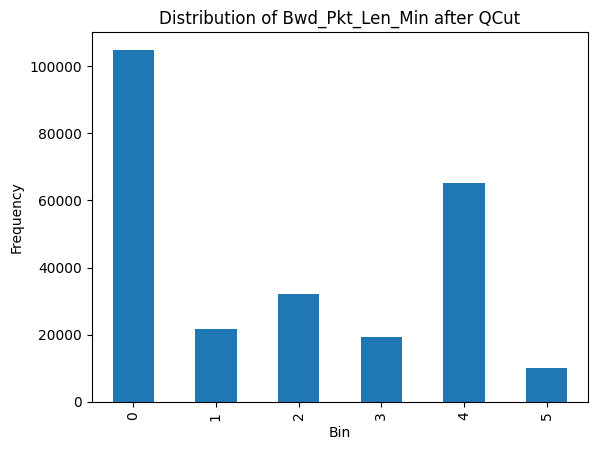

Binning column: Flow_IAT_Max


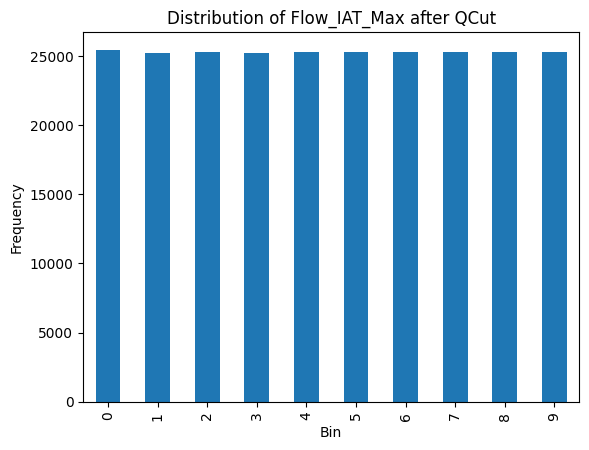

Binning column: Flow_IAT_Min


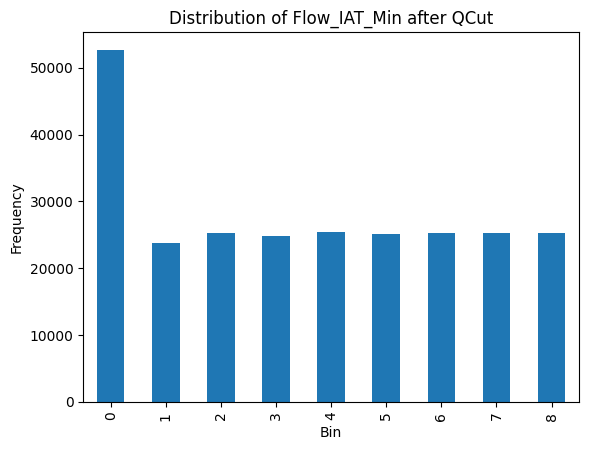

Binning column: Fwd_IAT_Tot


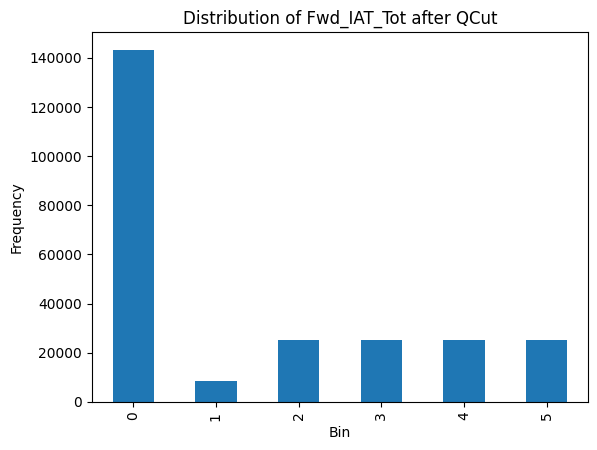

Binning column: Fwd_IAT_Max


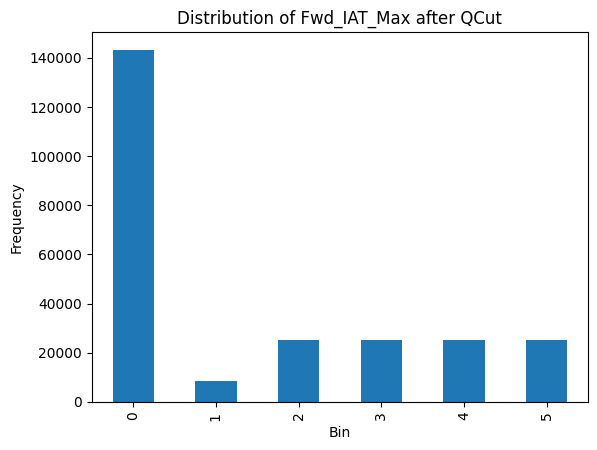

Binning column: Fwd_IAT_Min


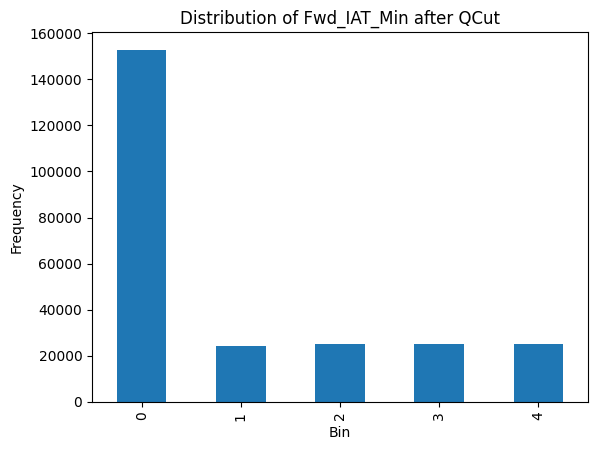

Binning column: Bwd_IAT_Tot


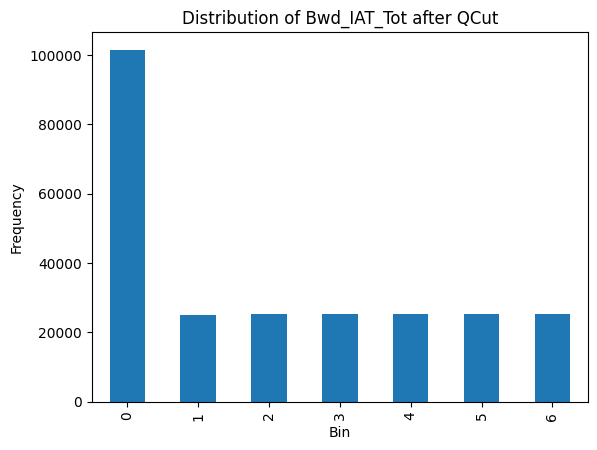

Binning column: Bwd_IAT_Max


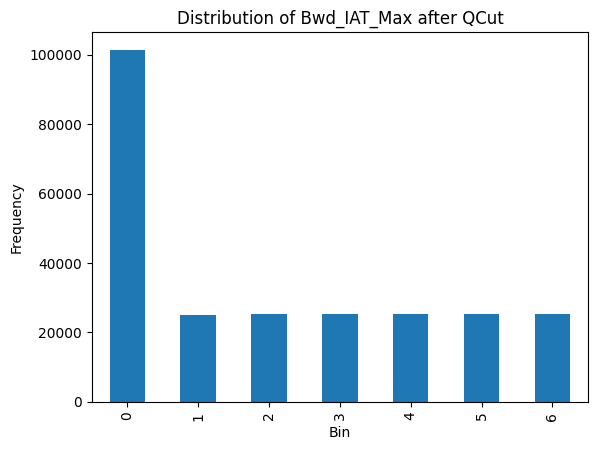

Binning column: Bwd_IAT_Min


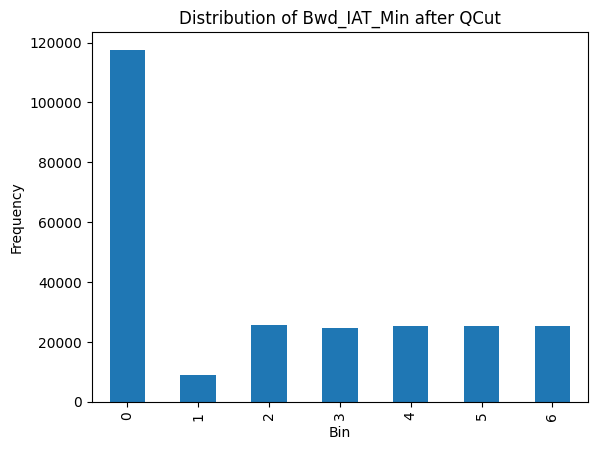

Binning column: Fwd_Header_Len


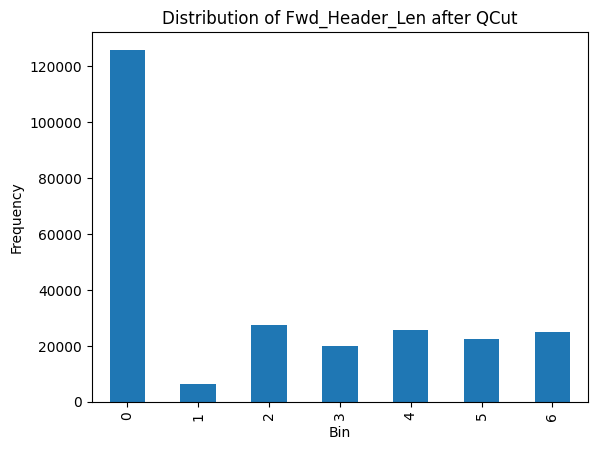

Binning column: Bwd_Header_Len


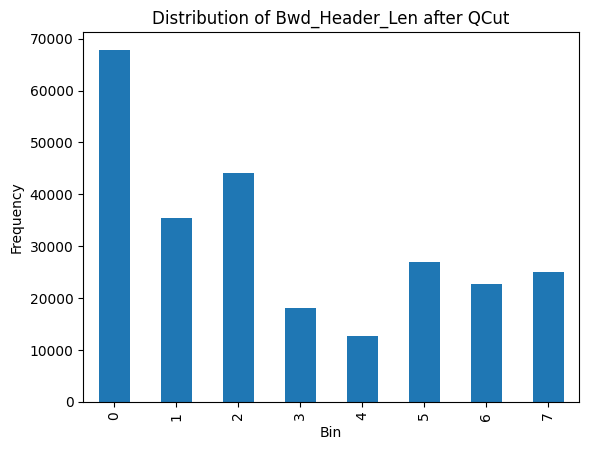

Binning column: Pkt_Len_Min


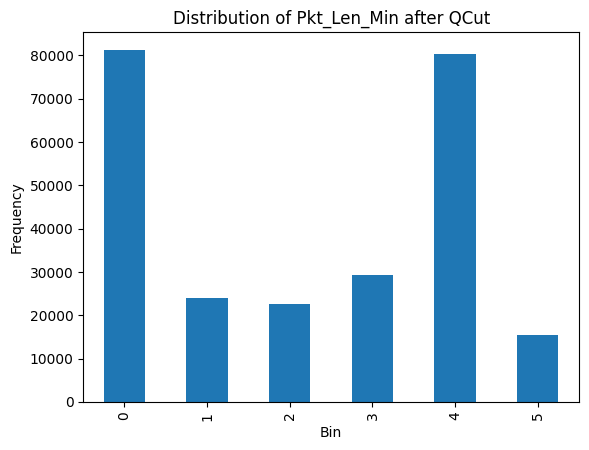

Binning column: Pkt_Len_Max


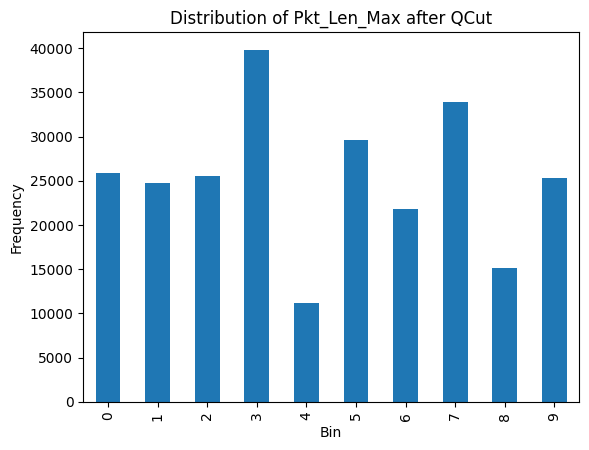

Binning column: Subflow_Fwd_Pkts


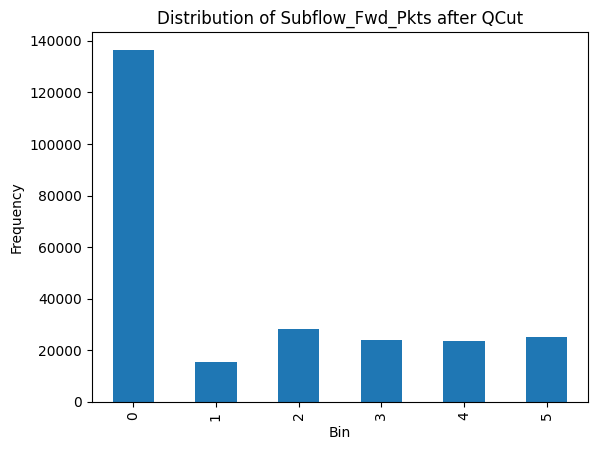

Binning column: Subflow_Fwd_Byts


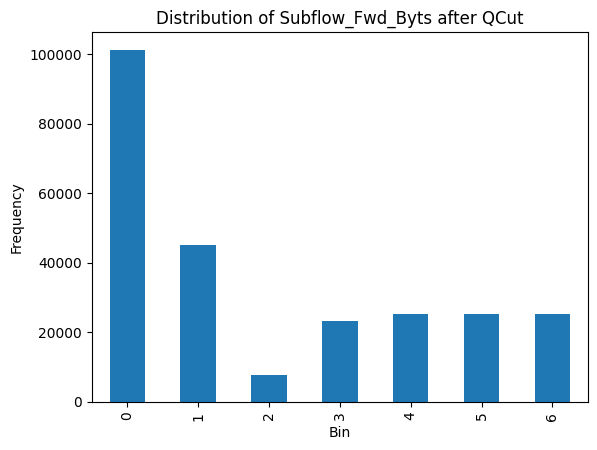

Binning column: Subflow_Bwd_Pkts


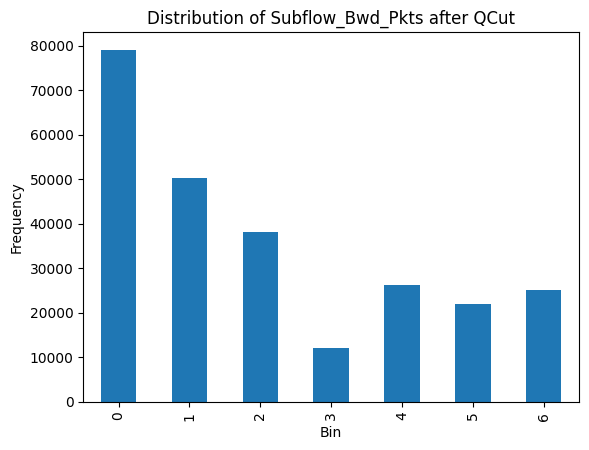

Binning column: Subflow_Bwd_Byts


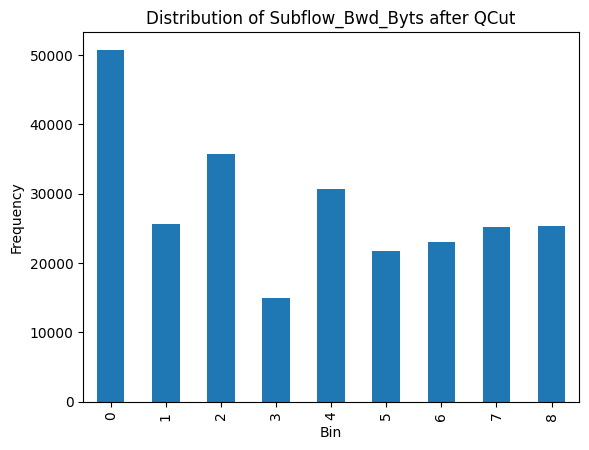

Binning column: Init_Fwd_Win_Byts


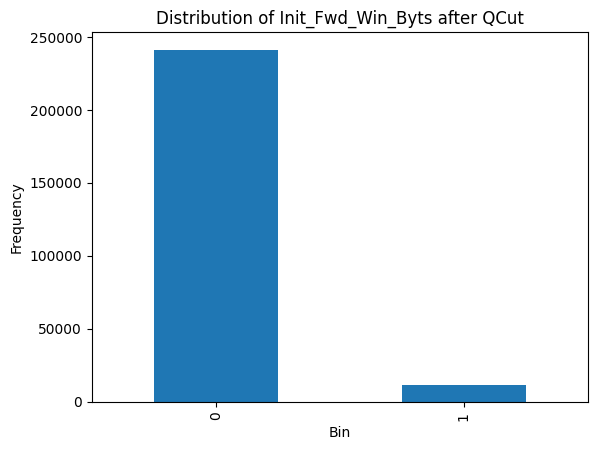

Binning column: Init_Bwd_Win_Byts


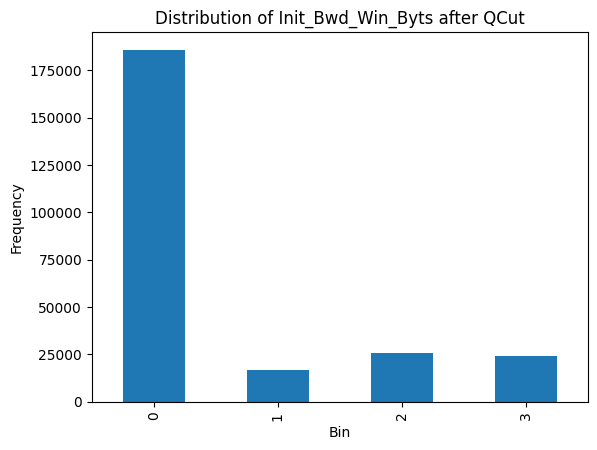

Binning column: Fwd_Act_Data_Pkts


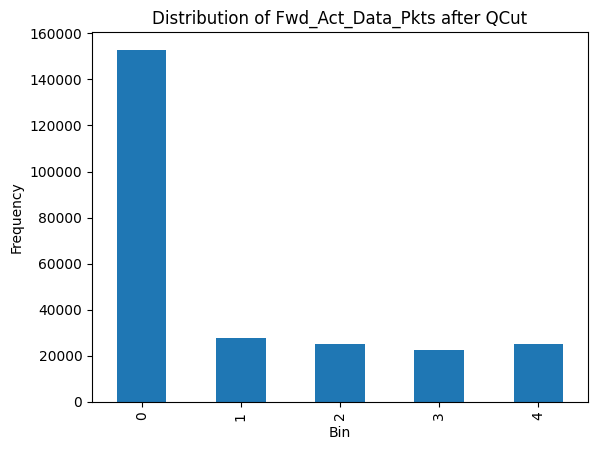

Binning column: Active_Max


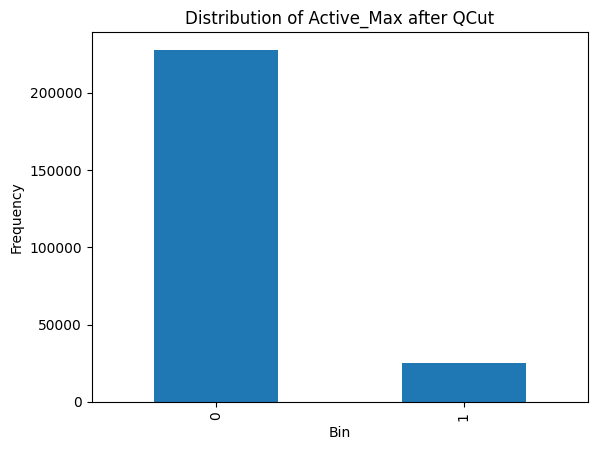

Binning column: Active_Min


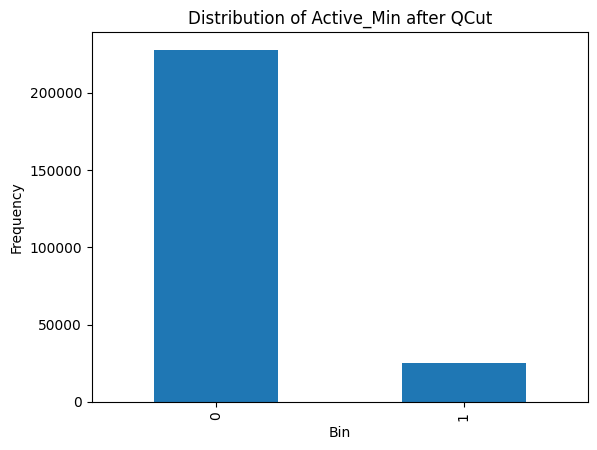

Binning column: Idle_Max


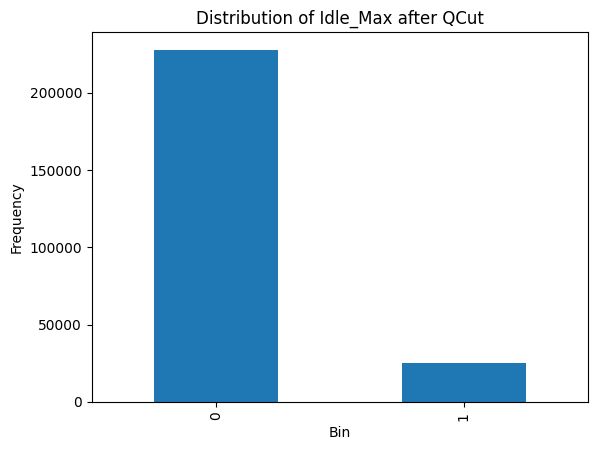

Binning column: Idle_Min


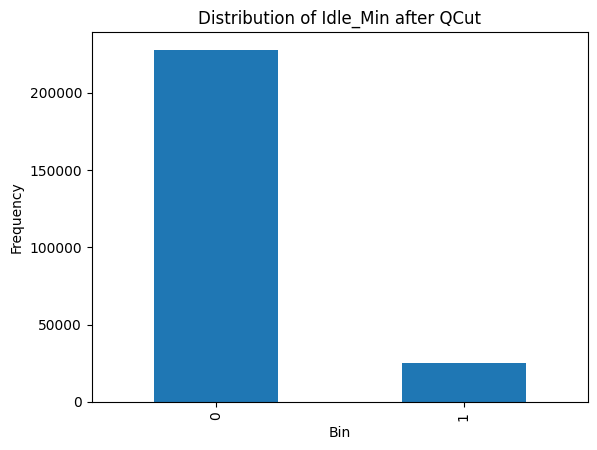

Binning column: Label


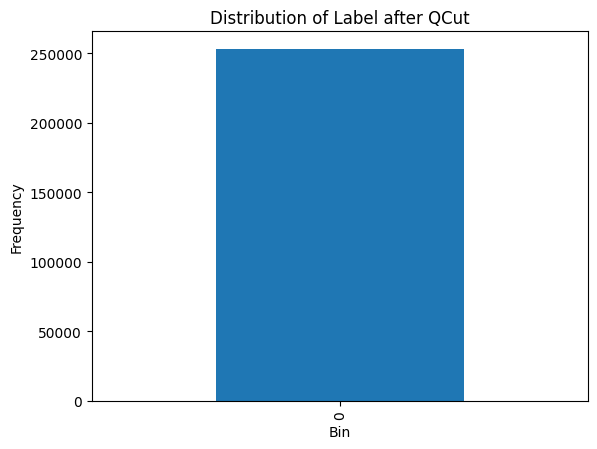

In [ ]:
# Use pre_df_cleaned for binning
pre_df_bin = pre_df.copy()

for i in range(0, len(num_attributes)):
  column = num_attributes[i]
  print(f'Binning column: {column}')

  # Check if the number of unique values is sufficient for binning
  if pre_df_bin[column].nunique() < 2:
    print(f"Skipping binning for column {column}: Insufficient unique values ({pre_df_bin[column].nunique()}).")
    continue

  try:
    # Use qcut for quantile-based binning
    pre_df_bin[column] = pd.qcut(pre_df_bin[column], q=10, labels=False, duplicates='drop') # Using 10 quantiles and dropping duplicates

    pre_df_bin[column].value_counts().sort_index().plot(kind='bar')
    plt.title(f'Distribution of {column} after QCut')
    plt.xlabel('Bin')
    plt.ylabel('Frequency')
    plt.show()

  except Exception as e:
    print(f"Could not bin column {column} using qcut: {e}")
    # If qcut fails, try standard cut with a fixed number of bins and drop duplicates
    try:
        print(f"Attempting standard cut for {column}")
        pre_df_bin[column] = pd.cut(pre_df_bin[column], bins=10, labels=False, duplicates='drop')
        pre_df_bin[column].value_counts().sort_index().plot(kind='bar')
        plt.title(f'Distribution of {column} after Cut')
        plt.xlabel('Bin')
        plt.ylabel('Frequency')
        plt.show()
    except Exception as e:
        print(f"Could not bin column {column} using cut: {e}")

In [ ]:
# Scaling the values for int64 & float64 features

from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.pipeline import Pipeline
import numpy as np
import pandas as pd

scaler = RobustScaler()
one_hot_encoder = OneHotEncoder(handle_unknown = 'ignore', sparse_output = False) # Set sparse_output to False

# Removing infinity type float64 columns and NaNs
pre_df_cleaned = pre_df.copy()
for column in pre_df.columns:
  if pre_df_cleaned[column].dtype == 'float64':
    pre_df_cleaned[column] = pre_df_cleaned[column].replace([np.inf, -np.inf], np.nan)
  # if pre_df_cleaned[column].dtype == 'int64':
  #   pre_df_cleaned[column] = pre_df_cleaned[column].replace(-np.inf, np.nan)
  if pre_df_cleaned[column].value_counts().shape[0] <= 1:
    pre_df_cleaned.drop(column, axis=1, inplace=True)

pre_df_cleaned.dropna(inplace=True)

# Update cat_attributes after removing single-valued columns
cat_attributes = [col for col in pre_df_cleaned.columns if col in cat_attributes]

num_attributes_float = list(pre_df_cleaned.select_dtypes(include=['float64']).columns)
num_attributes_int = [col for col in list(pre_df_cleaned.select_dtypes(include=['int64']).columns) if col not in cat_attributes and col != 'Label'] # Exclude 'Label'
num_attributes = num_attributes_float + num_attributes_int


pre_df_scaled = pre_df_cleaned.copy()
pre_df_scaled[num_attributes] = scaler.fit_transform(pre_df_scaled[num_attributes])

# Apply one-hot encoding and create a DataFrame from the result
encoded_cat_attributes = one_hot_encoder.fit_transform(pre_df_scaled[cat_attributes])
encoded_cat_df = pd.DataFrame(encoded_cat_attributes, columns=one_hot_encoder.get_feature_names_out(cat_attributes), index=pre_df_scaled.index)

# Concatenate the scaled numerical features and the encoded categorical features, including the 'Label' column
pre_df_scaled_encoded = pd.concat([pre_df_scaled.drop(columns=cat_attributes), encoded_cat_df], axis=1)

# Ensure the 'Label' column is still in the DataFrame and is the last column
label_column = pre_df_scaled_encoded.pop('Label')
pre_df_scaled_encoded['Label'] = label_column

# # Cleaning the categorical attributes
# cat_attributes_update = [col for col in pre_df_scaled.columns if col not in num_attributes]

# pre_df_scaled_encoded = pre_df_scaled.copy()
# # pre_df_scaled_encoded[cat_attributes_update] = one_hot_encoder.fit_transform(pre_df_scaled_encoded[cat_attributes_update])

# # pre_df_processed.head(10)

In [ ]:
pre_df_scaled_encoded['Label'].value_counts()

,count
Label,
0,161452
1,91354


In [ ]:
pre_df_scaled_encoded[num_attributes].describe()

,Fwd_Pkt_Len_Mean,Fwd_Pkt_Len_Std,Bwd_Pkt_Len_Mean,Bwd_Pkt_Len_Std,Flow_Byts/s,Flow_Pkts/s,Flow_IAT_Mean,Flow_IAT_Std,Fwd_IAT_Mean,Fwd_IAT_Std,...,Subflow_Fwd_Byts,Subflow_Bwd_Pkts,Subflow_Bwd_Byts,Init_Fwd_Win_Byts,Init_Bwd_Win_Byts,Fwd_Act_Data_Pkts,Active_Max,Active_Min,Idle_Max,Idle_Min
count,252806.000000,252806.000000,252806.000000,252806.000000,2.528060e+05,252806.000000,252806.000000,2.528060e+05,252806.000000,252806.000000,...,252806.000000,252806.000000,252806.000000,252806.000000,252806.000000,252806.000000,2.528060e+05,2.528060e+05,2.528060e+05,2.528060e+05
mean,0.488162,1.200062,0.356169,0.549757,1.222969e+00,0.604515,5.314271,5.785243e+00,4.826581,6.771070,...,38.845478,11.920793,72.515149,1459.187021,341.615184,8.678089,8.862585e+05,3.016109e+05,4.630981e+06,3.095411e+06
std,1.750563,3.018105,1.346661,1.430548,1.666140e+01,5.513971,20.953883,1.824253e+01,15.457904,22.432047,...,1615.523130,578.080630,4160.688204,9240.523260,1350.672337,291.363112,5.485915e+06,3.438564e+06,1.336237e+07,1.045350e+07
min,-0.508475,0.000000,-0.567132,-0.129961,-1.003989e-02,-49.616639,-0.043250,-5.384794e-04,-0.000655,0.000000,...,-0.090169,-0.222222,-0.102447,0.000000,0.000000,-0.166667,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,-0.508475,0.000000,-0.377014,-0.129961,-9.889520e-03,-0.005267,-0.040918,-5.384794e-04,0.000000,0.000000,...,-0.090169,-0.111111,-0.047809,0.000000,0.000000,-0.166667,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,0.000000,0.000000,0.000000,0.000000,6.435333e-19,0.000000,0.000000,5.484538e-20,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,0.491525,1.000000,0.622986,0.870039,9.901105e-01,0.994733,0.959082,9.994615e-01,1.000000,1.000000,...,0.909831,0.888889,0.952191,0.000000,1.000000,0.833333,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
max,45.977836,157.152061,31.591568,47.417302,3.606193e+03,248.050246,420.746021,3.261525e+02,321.107479,427.173712,...,425339.668475,102252.888889,738326.932840,65536.000000,6553.600000,83806.500000,1.146052e+08,1.146052e+08,1.200000e+08,1.200000e+08


# Correlation Matrix to Label

## Correlation Matrix to Numeric Features

In [ ]:
# Correlation matrix for Num Attributes
df_num = pre_df_scaled_encoded[num_attributes + ['Label']]
corr_matrix = df_num.corr()
corr_to_label = corr_matrix['Label'].sort_values(ascending = False)
print(corr_to_label)

Label                1.000000
Fwd_Pkt_Len_Mean     0.329984
Fwd_Pkt_Len_Min      0.283822
Init_Bwd_Win_Byts    0.279062
Init_Fwd_Win_Byts    0.209929
                       ...   
Idle_Min            -0.028801
Bwd_IAT_Mean        -0.049908
Bwd_IAT_Max         -0.059229
Bwd_IAT_Std         -0.069327
Src_Port            -0.131241
Name: Label, Length: 66, dtype: float64


In [ ]:
# import seaborn as sns
# import matplotlib.pyplot as plt


# plt.figure(figsize = (20,20), dpi = 160)
# heatmap_num = sns.heatmap(corr_matrix, annot = False, cmap = 'Reds', fmt = '.2f')
# heatmap_num.set_title('Correlation Heatmap of Label and Numerical Features', fontdict={'fontsize':12}, pad=12)

In [ ]:
!pip install fastcluster

<Figure size 3200x3200 with 0 Axes>

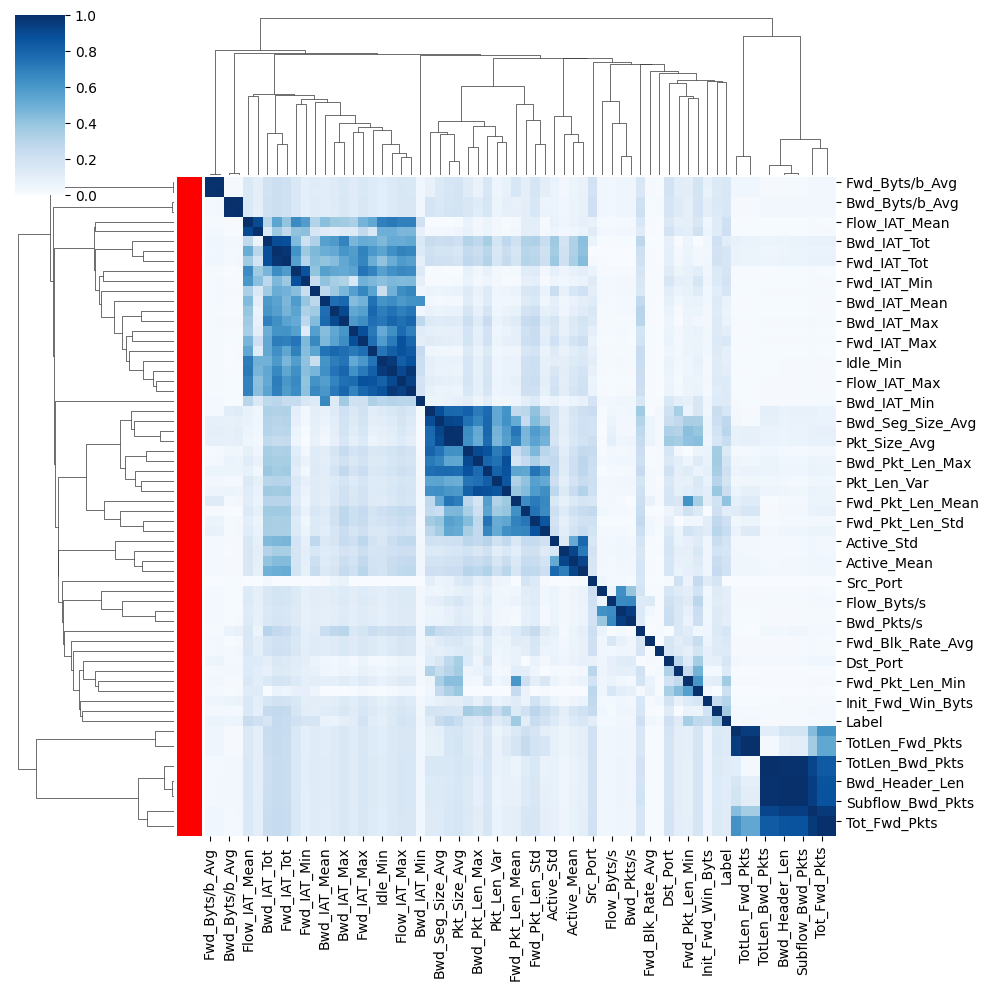

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import fastcluster as fc

# Create df_num by selecting numerical columns and 'Label' from pre_df_scaled_encoded
df_num = pre_df_scaled_encoded[num_attributes + ['Label']]

# Custom Color Pallete for Label Column
custom_palette = {
    0: 'blue',
    1: 'red'
}
row_colors = df_num['Label'].map(custom_palette).to_numpy()

# Calculate correlation matrix
corr_matrix = df_num.corr()

# Perform clustering using fastcluster
clusters = fc.linkage(corr_matrix, method='single', metric='euclidean')

plt.figure(figsize = (20,20), dpi = 160)
clustermap_num = sns.clustermap(
    corr_matrix, # Pass the correlation matrix to clustermap
    metric="euclidean",
    method = 'single',
    cmap = 'Blues',
    standard_scale = 1,
    annot = False,
    row_colors = row_colors,
    row_linkage=clusters,  # Use the clusters generated by fastcluster
    col_linkage=clusters   # Use the same clusters for columns for consistency
)
# clustermap_num.set_title('Correlation Heatmap of Label and Numerical Features', fontdict={'fontsize':12}, pad=12)
plt.show()

## Correlation Matrix to Categorical Features

In [ ]:
# Correlation matrix for Categorical Attributes
encoded_cat_columns = [col for col in pre_df_scaled_encoded.columns if any(col.startswith(cat + '_') for cat in cat_attributes)]

df_cat = pre_df_scaled_encoded[encoded_cat_columns + ['Label']]
corr_matrix_cat = df_cat.corr()
corr_to_label = corr_matrix_cat['Label'].sort_values(ascending = False)
print(corr_to_label)

Label                  1.000000
Fwd_Seg_Size_Min_8     0.539514
FIN_Flag_Cnt_1         0.371336
Fwd_Seg_Size_Min_20    0.296351
CWE_Flag_Count_1       0.238063
ECE_Flag_Cnt_1         0.238063
Protocol_0             0.132462
ACK_Flag_Cnt_0         0.119261
RST_Flag_Cnt_0         0.065491
Protocol_6             0.059609
Bwd_PSH_Flags_0        0.057547
PSH_Flag_Cnt_0         0.057547
SYN_Flag_Cnt_1         0.034126
SYN_Flag_Cnt_0        -0.034126
Bwd_PSH_Flags_1       -0.057547
PSH_Flag_Cnt_1        -0.057547
RST_Flag_Cnt_1        -0.065491
Protocol_17           -0.095207
ACK_Flag_Cnt_1        -0.119261
ECE_Flag_Cnt_0        -0.238063
CWE_Flag_Count_0      -0.238063
FIN_Flag_Cnt_0        -0.371336
Fwd_Seg_Size_Min_0    -0.641244
Name: Label, dtype: float64


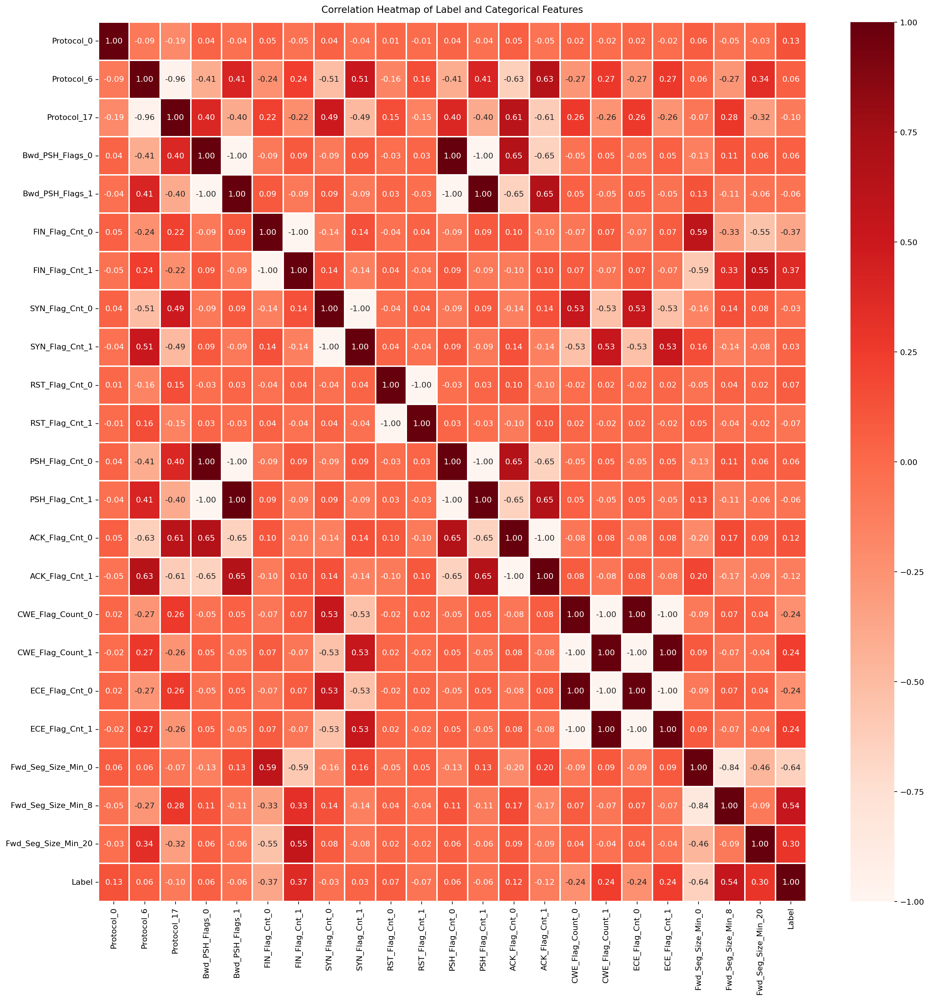

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


plt.figure(figsize=(20,20), dpi = 160)
heatmap_cat = sns.heatmap(corr_matrix_cat, annot = True, cmap = 'Reds', fmt = '.2f', linewidths=1, linecolor='white')
heatmap_cat.set_title('Correlation Heatmap of Label and Categorical Features', fontdict={'fontsize':12}, pad=12)
plt.show()

array([[<Axes: xlabel='Fwd_Pkt_Len_Mean', ylabel='Fwd_Pkt_Len_Mean'>,
        <Axes: xlabel='Label', ylabel='Fwd_Pkt_Len_Mean'>],
       [<Axes: xlabel='Fwd_Pkt_Len_Mean', ylabel='Label'>,
        <Axes: xlabel='Label', ylabel='Label'>]], dtype=object)

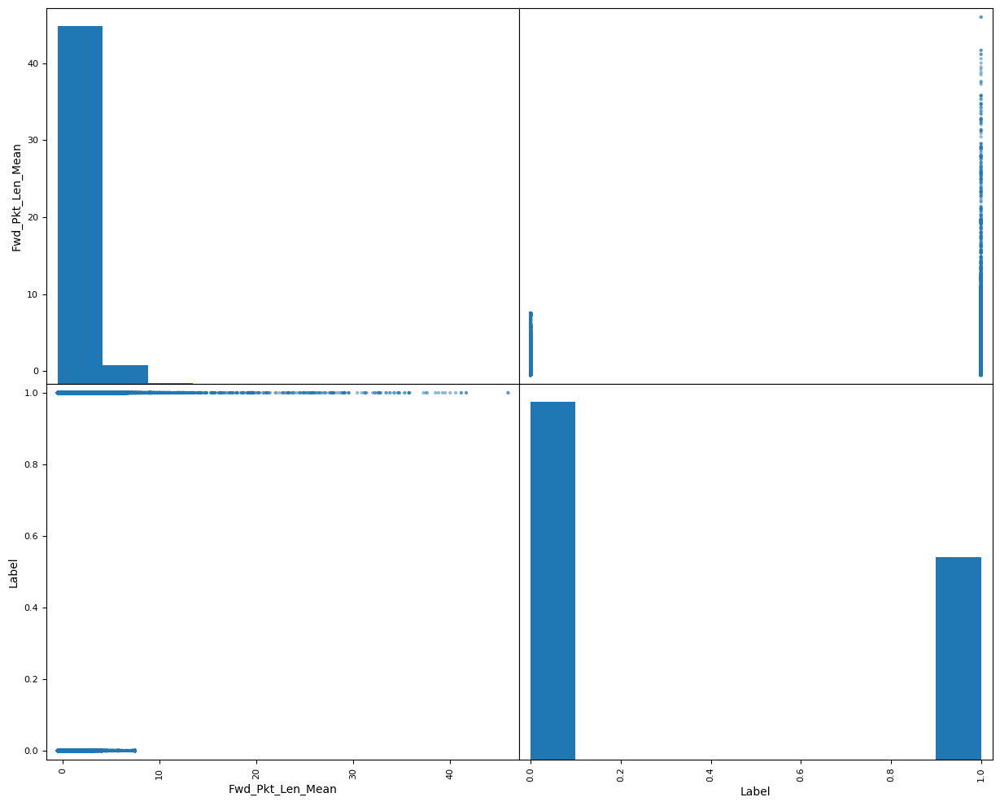

In [ ]:
from pandas.plotting import scatter_matrix
# attributes = ['Fwd_Seg_Size_Min_8', 'FIN_Flag_Cnt_1', 'CWE_Flag_Count_0', 'FIN_Flag_Cnt_0', 'Fwd_Seg_Size_Min_0']
attributes = ['Fwd_Pkt_Len_Mean', 'Label']
scatter_matrix(df_num[attributes], figsize=(15,12))

# Principal Component Analysis (PCA)

PCA (Principal Component Analysis) is a dimensionality reduction technique used in data analysis and machine learning. It prioritizes the directions where the data varies the most because more variation = more useful information.

# SafeSurf Darknet Layer 2 Layer 3

In [ ]:
file_name_2 = 'SafeSurf Dataset Layer 2 & 3.csv'
file_path_2 =  os.path.join(save_path, file_name_2)

data_frame_2 = pd.read_csv(file_path_2)
print(f'The dataset has {data_frame_2.shape[0]} rows and {data_frame_2.shape[1]} columns')

The dataset has 91404 rows and 84 columns


In [ ]:
df_2 = data_frame_2.copy()
df_2.head(10)

,Src IP,Src Port,Dst IP,Dst Port,Protocol,Timestamp,Flow Duration,Tot Fwd Pkts,Tot Bwd Pkts,TotLen Fwd Pkts,...,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label,Label_2
0,13.83.126.253,1194,192.168.200.136,42796,17,3/3/2025 20:31,118045988,177,175,48365,...,22590692.25,20961845.56,50206758,417585,6.708557e+06,9.217358e+05,7774731,5550108,VPN,Audio
1,192.168.200.136,57621,192.168.200.255,57621,17,3/3/2025 20:31,90026370,3,1,132,...,0.00,0.00,0,0,3.000879e+07,1.250739e+04,30023227,30001233,VPN,Audio
2,13.83.126.253,1194,192.168.200.136,42796,17,3/3/2025 20:33,111011533,7964,3228,10145344,...,23004743.00,15648124.03,39628371,8560635,8.078238e+06,2.523863e+06,10710281,5678637,VPN,Audio
3,192.168.200.136,57621,192.168.200.255,57621,17,3/3/2025 20:33,99838718,5,1,220,...,3029139.00,0.00,3029139,3029139,2.420239e+07,1.164261e+07,30039552,6738482,VPN,Audio
4,192.168.200.136,5353,224.0.0.251,5353,17,3/3/2025 20:32,119999236,1,1,45,...,0.00,0.00,0,0,1.199992e+08,0.000000e+00,119999236,119999236,VPN,Audio
5,13.83.126.253,1194,192.168.200.136,42796,17,3/3/2025 20:35,119045844,415,344,299895,...,10726170.50,12914005.20,28960167,400832,6.061494e+06,1.539100e+06,9019345,5000947,VPN,Audio
6,192.168.200.136,57621,192.168.200.255,57621,17,3/3/2025 20:36,95531971,5,1,220,...,5444231.00,0.00,5444231,5444231,3.002925e+07,1.116559e+04,30038850,30016995,VPN,Audio
7,13.83.126.253,1194,192.168.200.136,42796,17,3/3/2025 20:38,119692965,700,586,408568,...,15943534.75,11868532.52,32343887,4060178,7.319981e+06,1.197165e+06,8881546,5978411,VPN,Audio
8,192.168.200.136,57621,192.168.200.255,57621,17,3/3/2025 20:38,90003992,3,1,132,...,0.00,0.00,0,0,3.000133e+07,4.653712e+02,30001868,30001057,VPN,Audio
9,192.168.200.136,43974,239.255.255.250,1900,17,3/3/2025 20:36,119999338,1,1,125,...,0.00,0.00,0,0,1.199993e+08,0.000000e+00,119999338,119999338,VPN,Audio


In [ ]:
df_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91404 entries, 0 to 91403
Data columns (total 84 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Src IP             91404 non-null  object 
 1   Src Port           91404 non-null  int64  
 2   Dst IP             91404 non-null  object 
 3   Dst Port           91404 non-null  int64  
 4   Protocol           91404 non-null  int64  
 5   Timestamp          91404 non-null  object 
 6   Flow Duration      91404 non-null  int64  
 7   Tot Fwd Pkts       91404 non-null  int64  
 8   Tot Bwd Pkts       91404 non-null  int64  
 9   TotLen Fwd Pkts    91404 non-null  int64  
 10  TotLen Bwd Pkts    91404 non-null  int64  
 11  Fwd Pkt Len Max    91404 non-null  int64  
 12  Fwd Pkt Len Min    91404 non-null  int64  
 13  Fwd Pkt Len Mean   91404 non-null  float64
 14  Fwd Pkt Len Std    91404 non-null  float64
 15  Bwd Pkt Len Max    91404 non-null  int64  
 16  Bwd Pkt Len Min    914

## Multiclass Classification

In [ ]:
label_column = df_2['Label'].value_counts()
for label in label_column.index:
  print(f'{label} = {label_column[label]}')
  print(f'{label} Percentage = {label_column[label] / df_2.shape[0] * 100}')

Freenet = 26284
Freenet Percentage = 28.755853135530174
Zeronet = 25499
Zeronet Percentage = 27.897028576429918
I2P = 22958
I2P Percentage = 25.117062710603477
Tor = 12546
Tor Percentage = 13.725876329263489
VPN = 4117
VPN Percentage = 4.504179248172947


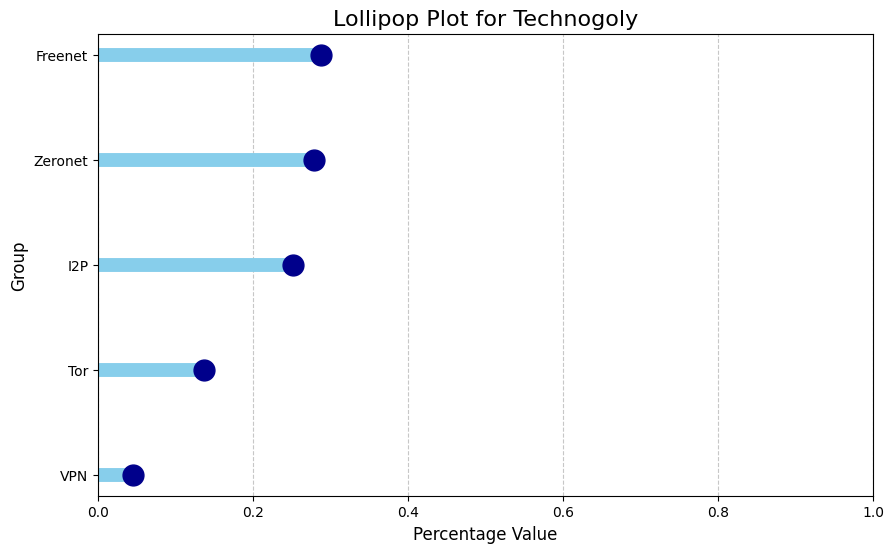

In [ ]:
# import pandas as pd
import matplotlib.pyplot as plt

per_val = label_column.values / df_2.shape[0]
# Create the data
data = {'group': label_column.index,
        'values': per_val}
df = pd.DataFrame(data)

# Reorder the dataframe
ordered_df = df.sort_values(by='values')

# Set the y-axis range and labels
my_range = range(1, len(df.index) + 1)

# Create the plot
plt.figure(figsize=(10, 6))

# Plot the horizontal lines (sticks)
plt.hlines(y=my_range, xmin=0, xmax=ordered_df['values'], color='skyblue', linewidth=10)

# Plot the circular markers (lollipops)
plt.plot(ordered_df['values'], my_range, "o", markersize=15, color='darkblue')

# Set y-axis tick labels
plt.yticks(my_range, ordered_df['group'])

# Add labels and a title
plt.title("Lollipop Plot for Technogoly", loc='center', fontsize=16)
plt.xlabel("Percentage Value", fontsize=12)
plt.ylabel("Group", fontsize=12)

# Adjust plot limits for better visualization
plt.xlim(0, 1)

# Add a grid for better readability
plt.grid(axis='x', linestyle='--', alpha=0.7)
# plt.figure(figsize=(10,6))

# Save the plot
plt.savefig("lollipop_plot_Technogoly.png")

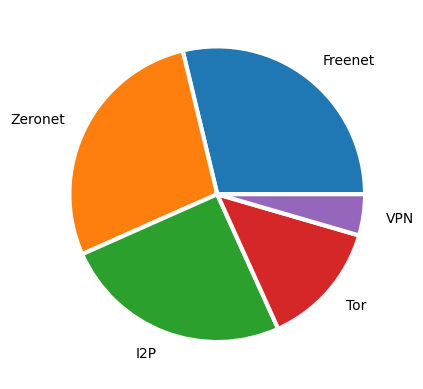

In [ ]:
per_val = label_column.values / df_2.shape[0] * 100
# Create the data
data = {'group': label_column.index,
        'values': per_val}
df = pd.DataFrame(data)
plt.pie(per_val, labels=label_column.index,  labeldistance=1.15, wedgeprops = { 'linewidth' : 3, 'edgecolor' : 'white' });

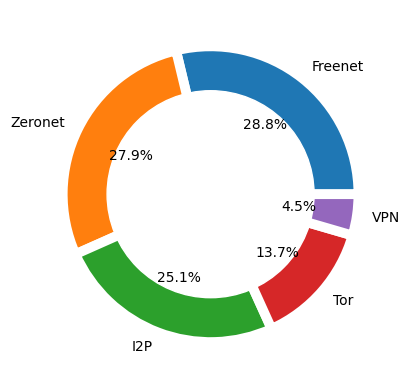

In [ ]:
# library
import matplotlib.pyplot as plt

# create data
names = label_column.index
size = per_val

# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Custom wedges
plt.pie(size, labels=names, autopct= '%1.1f%%', wedgeprops = { 'linewidth' : 7, 'edgecolor' : 'white' })
p = plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

## Behavior Classification

In [ ]:
label_column = df_2['Label_2'].value_counts()
for label in label_column.index:
  print(f'{label} = {label_column[label]}')
  print(f'{label} Percentage = {label_column[label] / df_2.shape[0] * 100}')

per_val = label_column.values / df_2.shape[0] * 100
# Create the data
data = {'group': label_column.index,
        'values': per_val}
df = pd.DataFrame(data)

Browsing = 33586
Browsing Percentage = 36.74456260119907
FTP = 20214
FTP Percentage = 22.11500590783773
Video = 9559
Video Percentage = 10.457966828585183
P2P = 9392
P2P Percentage = 10.275261476521816
Email = 7873
Email Percentage = 8.613408603562208
Audio = 5953
Audio Percentage = 6.512844076845652
Chat = 3489
Chat Percentage = 3.81711960089274
VOIP = 1338
VOIP Percentage = 1.4638309045555993


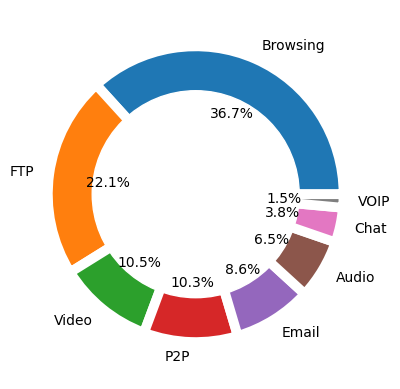

In [ ]:
# create data
names = label_column.index
size = per_val

# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Custom wedges
plt.pie(size, labels=names, autopct= '%1.1f%%', wedgeprops = { 'linewidth' : 7, 'edgecolor' : 'white' })
p = plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

# Dendogram of the Dataset

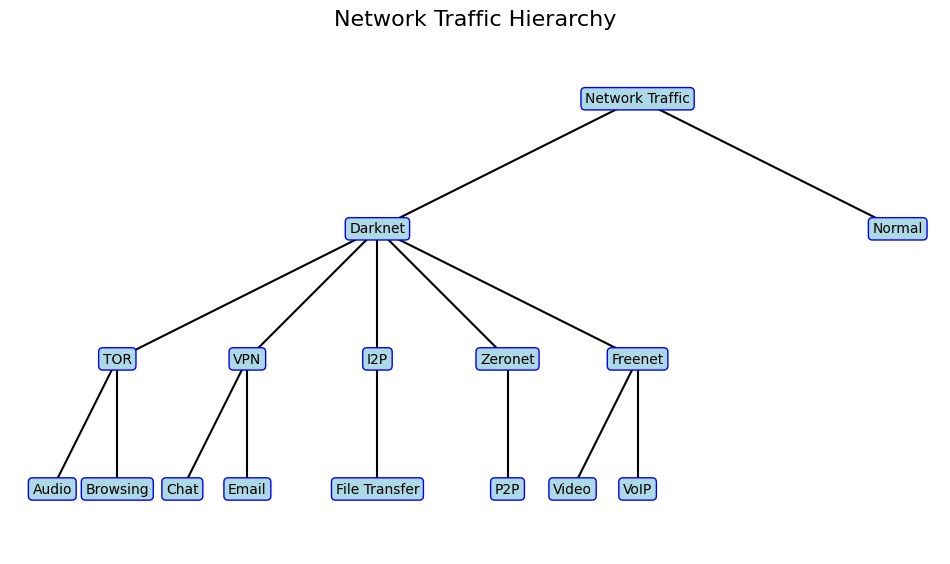

In [ ]:
import matplotlib.pyplot as plt

# Define the positions for each node in the hierarchy
pos = {
    'Network Traffic': (0, 0),
    'Darknet': (-2, -1),
    'Normal': (2, -1),
    'TOR': (-4, -2),
    'VPN': (-3, -2),
    'I2P': (-2, -2),
    'Zeronet': (-1, -2),
    'Freenet': (0, -2),
    'Audio': (-4.5, -3),
    'Browsing': (-4, -3),
    'Chat': (-3.5, -3),
    'Email': (-3, -3),
    'File Transfer': (-2, -3),
    'P2P': (-1, -3),
    'Video': (-0.5, -3),
    'VoIP': (0, -3)
}

# Define the connections (the lines/branches)
connections = [
    ('Network Traffic', 'Darknet'),
    ('Network Traffic', 'Normal'),
    ('Darknet', 'TOR'),
    ('Darknet', 'VPN'),
    ('Darknet', 'I2P'),
    ('Darknet', 'Zeronet'),
    ('Darknet', 'Freenet'),
    ('TOR', 'Audio'),
    ('TOR', 'Browsing'),
    ('VPN', 'Chat'),
    ('VPN', 'Email'),
    ('I2P', 'File Transfer'),
    ('Zeronet', 'P2P'),
    ('Freenet', 'Video'),
    ('Freenet', 'VoIP')
]

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8))

# Draw the nodes with labels
for node, position in pos.items():
    ax.text(position[0], position[1], node, ha='center', va='center',
            bbox=dict(boxstyle='round,pad=0.3', fc='lightblue', ec='blue', lw=1))

# Draw the lines connecting the nodes
for start, end in connections:
    ax.plot([pos[start][0], pos[end][0]], [pos[start][1], pos[end][1]], 'k-')

# Customize the plot
ax.set_title("Network Traffic Hierarchy", fontsize=16)
ax.set_aspect('equal')
ax.axis('off')
ax.set_ylim(-3.5, 0.5)

# Save the figure
plt.savefig('dendrogram_approximation.png')